# Setup

In [1]:
# import packages
%run ../global_packages.py

# get the global parameters
%run ../global_pars.py

# import your local functions
sys.path.insert(1, '../')
from global_functions import *

# make sure the figures plot inline rather than at the end
%matplotlib inline

# Paths

In [2]:
figpath = '../figures/supplementary_information/'

# Annual Cycle All years 1993-2020

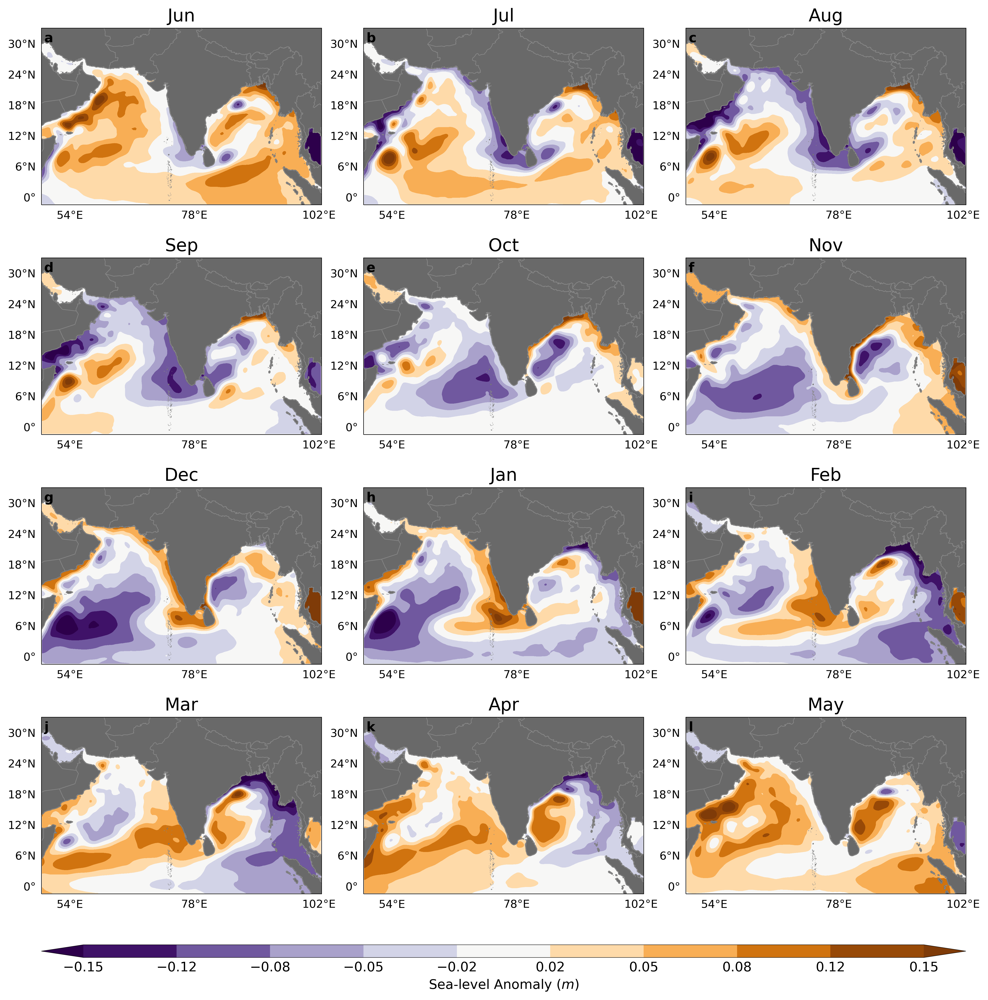

In [23]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_clim = ds_SLA['mon_sla_mon_clim']
lat = mon_sla_mon_clim.lat.values
lon = mon_sla_mon_clim.lon.values

mon_sla_mon_clim = mon_sla_mon_clim.roll(month=-5,roll_coords = False)

fig = plt.figure(figsize=(15,16),dpi=400)

cmin = -0.15
cmax = 0.15

levels = np.round(np.linspace(cmin, cmax, 10),2)
sz = 30
fsz = 12
alpha = 0.25

params = {'legend.fontsize': 10,
         'axes.labelsize': 12,
         'axes.titlesize': 16,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)

months = ['Jun','Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar', 'Apr', 'May']
letters = ['a','b','c','d','e','f','g','h','i','j','k','l']
xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))

##############################################################

for tt in range(12):
    ax = fig.add_subplot(4,3,tt+1,projection= ccrs.PlateCarree())
    c = ax.contourf(xx,yy,mon_sla_mon_clim[tt,:,:],
              levels = levels,cmap=plt.cm.PuOr_r,vmax=cmax,vmin=cmin, extend="both")

    g = add_land(ax, bounds = cm_bounds,countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 10}
    g.ylabel_style = {'size': 10}
    ax.set_title(months[tt])
    add_letter(ax, letters[tt], x = 0.01,y=0.92)
    
cbar_ax = fig.add_axes([0.125, 0.15, 0.775, 0.01])
cbar = fig.colorbar(c,cax=cbar_ax, pad=0.04, orientation = 'horizontal')
cbar.set_label('Sea-level Anomaly ($m$)')

plt.subplots_adjust(wspace = 0.15, hspace = 0.3,bottom = 0.2)

plt.savefig(figpath + 'Fig_SI_sla_annual_cycle.pdf', format='pdf', dpi = 400)

# Annual cycle during positive IOD phases

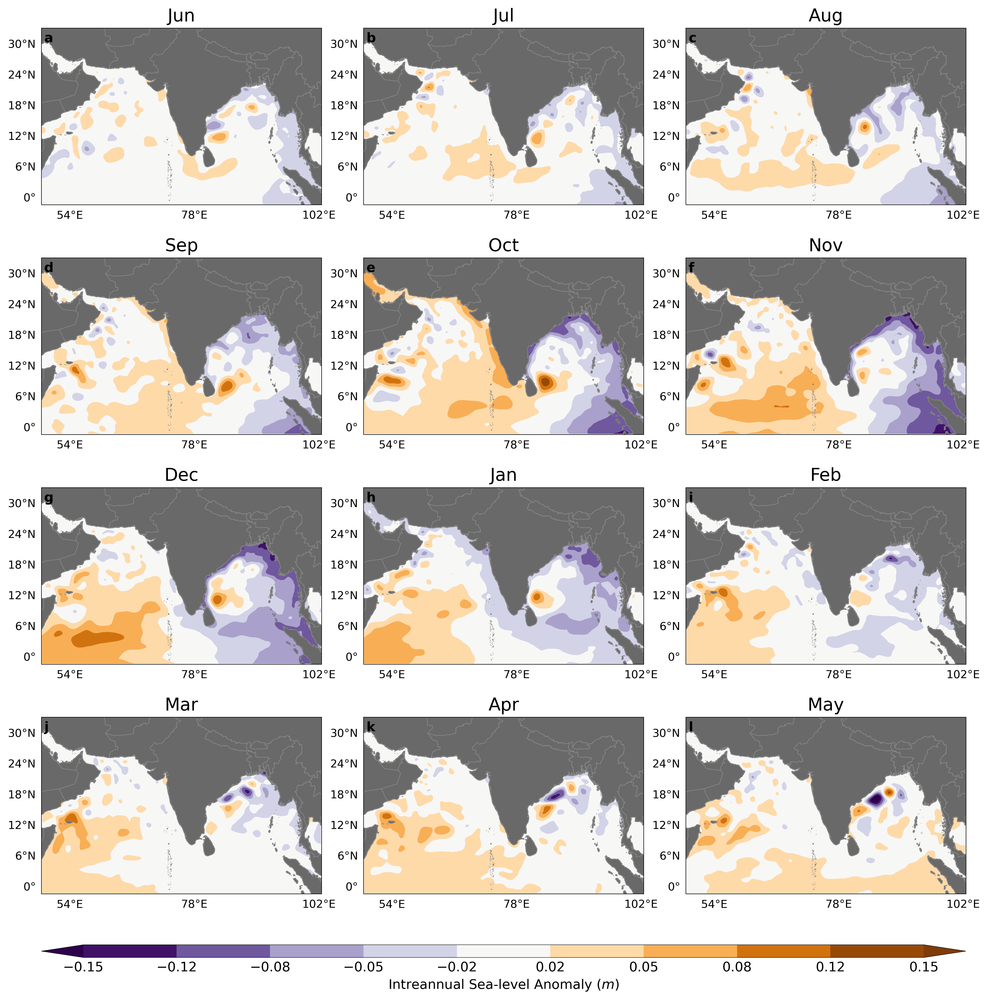

In [24]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_anom = ds_SLA['mon_sla_mon_anom']
lat = mon_sla_mon_anom.lat.values
lon = mon_sla_mon_anom.lon.values

# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')
posIODyears = list(np.array(ds_DMI.pos_IOD_years)) 

# average over the positive IOD years 
posIOD_mon_sla_mon_anom,_ = IOD_year_group_grid(mon_sla_mon_anom,IODyear_begin,IODyear_end,posIODyears)


fig = plt.figure(figsize=(15,16),dpi=400)

cmin = -0.15
cmax = 0.15

levels = np.round(np.linspace(cmin, cmax, 10),2)
sz = 30
fsz = 12
alpha = 0.25

params = {'legend.fontsize': 10,
         'axes.labelsize': 12,
         'axes.titlesize': 16,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)

months = ['Jun','Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar', 'Apr', 'May']
letters = ['a','b','c','d','e','f','g','h','i','j','k','l']
xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))

##############################################################

for tt in range(12):
    ax = fig.add_subplot(4,3,tt+1,projection= ccrs.PlateCarree())
    c = ax.contourf(xx,yy,posIOD_mon_sla_mon_anom[tt,:,:],
              levels = levels,cmap=plt.cm.PuOr_r,vmax=cmax,vmin=cmin, extend="both")

    g = add_land(ax, bounds = cm_bounds,countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 10}
    g.ylabel_style = {'size': 10}
    ax.set_title(months[tt])
    add_letter(ax, letters[tt], x = 0.01,y=0.92)
    
cbar_ax = fig.add_axes([0.125, 0.15, 0.775, 0.01])
cbar = fig.colorbar(c,cax=cbar_ax, pad=0.04, orientation = 'horizontal')
cbar.set_label('Intreannual Sea-level Anomaly ($m$)')

plt.subplots_adjust(wspace = 0.15, hspace = 0.3,bottom = 0.2)

plt.savefig(figpath + 'Fig_SI_posiod_sla_annual_cycle.pdf', format='pdf', dpi = 400)

# Annual cycle during negative IOD phases

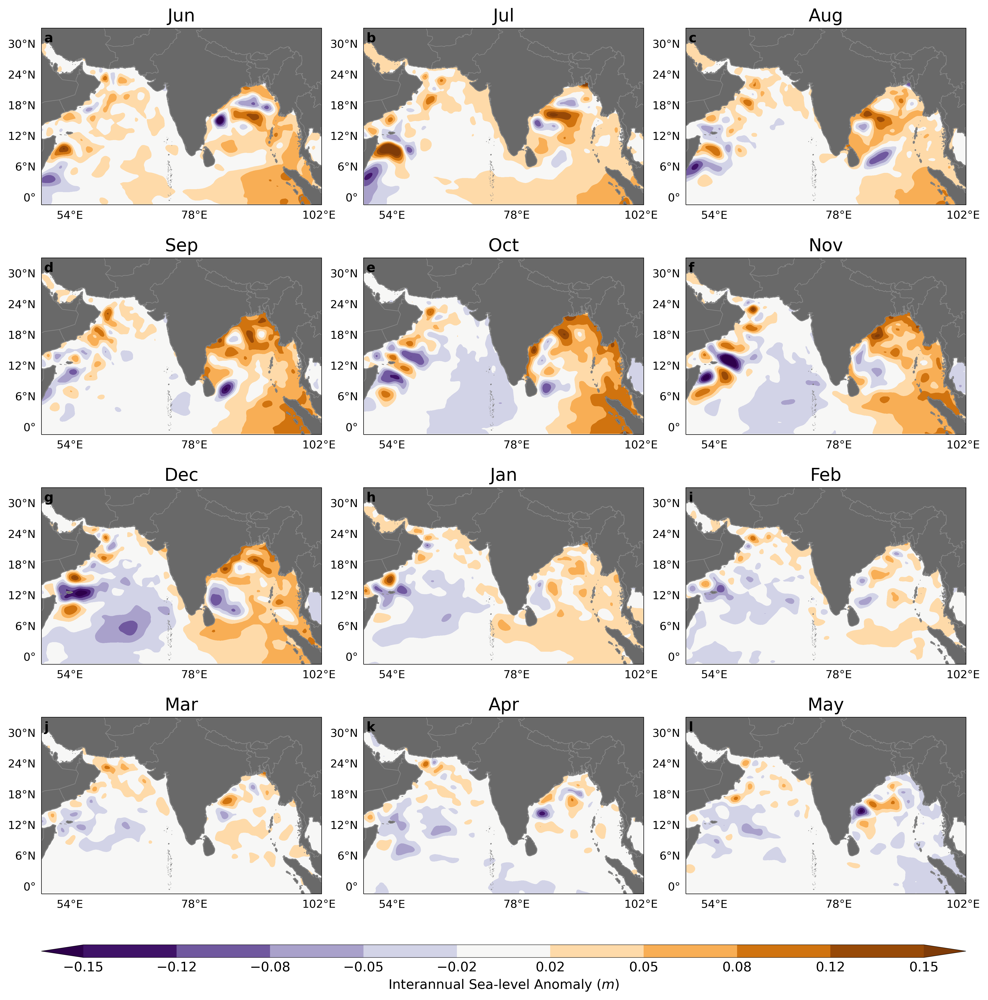

In [25]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_anom = ds_SLA['mon_sla_mon_anom']
lat = mon_sla_mon_anom.lat.values
lon = mon_sla_mon_anom.lon.values

# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')
negIODyears = list(np.array(ds_DMI.neg_IOD_years)) 

# average over the negative IOD years
negIOD_mon_sla_mon_anom,_ = IOD_year_group_grid(mon_sla_mon_anom,IODyear_begin,IODyear_end,negIODyears)

fig = plt.figure(figsize=(15,16),dpi=400)

cmin = -0.15
cmax = 0.15

levels = np.round(np.linspace(cmin, cmax, 10),2)
sz = 30
fsz = 12
alpha = 0.25

params = {'legend.fontsize': 10,
         'axes.labelsize': 12,
         'axes.titlesize': 16,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)

months = ['Jun','Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar', 'Apr', 'May']
letters = ['a','b','c','d','e','f','g','h','i','j','k','l']
xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))

##############################################################

for tt in range(12):
    ax = fig.add_subplot(4,3,tt+1,projection= ccrs.PlateCarree())
    c = ax.contourf(xx,yy,negIOD_mon_sla_mon_anom[tt,:,:],
              levels = levels,cmap=plt.cm.PuOr_r,vmax=cmax,vmin=cmin, extend="both")

    g = add_land(ax, bounds = cm_bounds,countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 10}
    g.ylabel_style = {'size': 10}
    ax.set_title(months[tt])
    add_letter(ax, letters[tt], x = 0.01,y=0.92)
    
cbar_ax = fig.add_axes([0.125, 0.15, 0.775, 0.01])
cbar = fig.colorbar(c,cax=cbar_ax, pad=0.04, orientation = 'horizontal')
cbar.set_label('Interannual Sea-level Anomaly ($m$)')

plt.subplots_adjust(wspace = 0.15, hspace = 0.3,bottom = 0.2)

plt.savefig(figpath + 'Fig_SI_negiod_sla_annual_cycle.pdf', format='pdf', dpi = 400)

# DMI and SLA Correlation Maps

In [26]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_anom = ds_SLA['mon_sla_mon_anom']
lat = mon_sla_mon_anom.lat.values
lon = mon_sla_mon_anom.lon.values

xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))
xx = xx.flatten()
yy = yy.flatten()

# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

#subset DMI to SLA time span
time_slice = slice('1993-01-01','2020-05-01')
dmi = ds_DMI['dmi'].sel(time = time_slice)

# find DMI seasons
season = np.ones(dmi.time.shape)
for tt in range(dmi.time.shape[0]):
    mm = dmi.time.dt.month[tt]
    if (mm == 12) | (mm == 1) | (mm == 2) | (mm == 3) | (mm == 4) | (mm == 5):
        season[tt] = 0    
   
    
# Interannual Anomaly Correlations
n = len(ds_SLA.lat)
m = len(ds_SLA.lon)
    
SLOPE_sla_dmi = np.full([n,m,2],np.nan)
INTERCEPT_sla_dmi = np.full([n,m,2],np.nan)
R_VALUE_sla_dmi = np.full([n,m,2],np.nan)
P_VALUE_sla_dmi = np.full([n,m,2],np.nan)
STD_ERR_sla_dmi = np.full([n,m,2],np.nan)

for ss in range(2):
    with tqdm(total=n * m) as pbar:
        for ii,jj in itertools.product(np.arange(n),np.arange(m)):
            tempvar1 = np.array(ds_SLA.mon_sla_mon_anom[:,ii,jj])
            tempvar2 = np.array(dmi)
            
            #subset for season
            ind = (season == ss)
            tempvar1 = tempvar1[ind]
            tempvar2 = tempvar2[ind]
            
            #subset for season
            

            nanmask = ~np.isnan(tempvar1)

            if tempvar1[nanmask].size != 0:
                slope, intercept, r_value, p_value, std_err=stats.linregress(tempvar1[nanmask],tempvar2[nanmask])

                SLOPE_sla_dmi[ii,jj,ss] = slope
                INTERCEPT_sla_dmi[ii,jj,ss] = intercept
                R_VALUE_sla_dmi[ii,jj,ss] = r_value
                P_VALUE_sla_dmi[ii,jj,ss] = p_value
                STD_ERR_sla_dmi[ii,jj,ss] = std_err

            pbar.update(1)
            

100%|██████████| 29808/29808 [02:04<00:00, 240.37it/s]


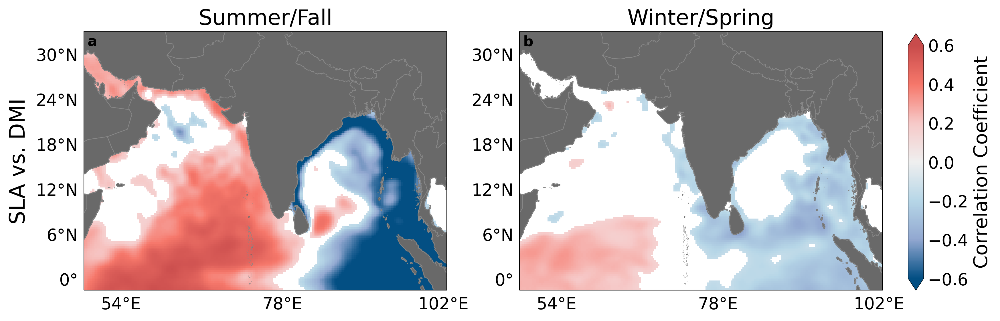

In [27]:
            
# Plot

fig = plt.figure(figsize=(12,4),dpi=300)
sz = 5

cmin_corr = -0.6
cmax_corr = 0.6

cmap = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#D3D3D3','#DcDcDc','#F0F0F0'],
                           [0,0.4,0.6,0.8,0.9,1])

cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

params = {'legend.fontsize': 14,
         'axes.labelsize': 16,
         'axes.titlesize': 18,
         'xtick.labelsize':14,
         'ytick.labelsize':14}
pylab.rcParams.update(params)

##############################################################

ax = fig.add_subplot(121,projection= ccrs.PlateCarree())
tmp = R_VALUE_sla_dmi[:,:,1].flatten()
hatch_var = P_VALUE_sla_dmi[:,:,1].flatten()
hatch_mask = hatch_var <= 0.5
p = ax.scatter(xx[hatch_var <= 0.05],yy[hatch_var <= 0.05],c = tmp[hatch_var <= 0.05],marker='s',s= sz,linewidth=0,
               cmap=cmap2,transform=ccrs.PlateCarree(),vmin=cmin_corr,vmax=cmax_corr)
#                norm=mpl.colors.SymLogNorm(linthresh=0.1, linscale=1,vmin=cmin_corr,vmax=cmax_corr))
ax.set_title('Summer/Fall')
ylabel_map(ax,label='SLA vs. DMI')
g = add_land(ax, bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 14}
g.ylabel_style = {'size': 14}
add_letter(ax, 'a')

ax = fig.add_subplot(122,projection= ccrs.PlateCarree())
tmp = R_VALUE_sla_dmi[:,:,0].flatten()
hatch_var = P_VALUE_sla_dmi[:,:,0].flatten()
hatch_mask = hatch_var <= 0.5
p = ax.scatter(xx[hatch_var <= 0.05],yy[hatch_var <= 0.05],c = tmp[hatch_var <= 0.05],marker='s',s= sz,linewidth=0,
               cmap=cmap2,transform=ccrs.PlateCarree(),vmin=cmin_corr,vmax=cmax_corr)
#               norm=mpl.colors.SymLogNorm(linthresh=0.1, linscale=1,vmin=cmin_corr,vmax=cmax_corr))
g = add_land(ax, bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 14}
g.ylabel_style = {'size': 14}
ax.set_title('Winter/Spring')
add_letter(ax, 'b')

add_single_vert_cbar(fig,p,'Correlation Coefficient', extend = 'both')
plt.savefig(figpath + 'Fig_SI_sla_dmi_corr_map.pdf', format='pdf', dpi = 400)

# DMI over time

/home/jennap/anaconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


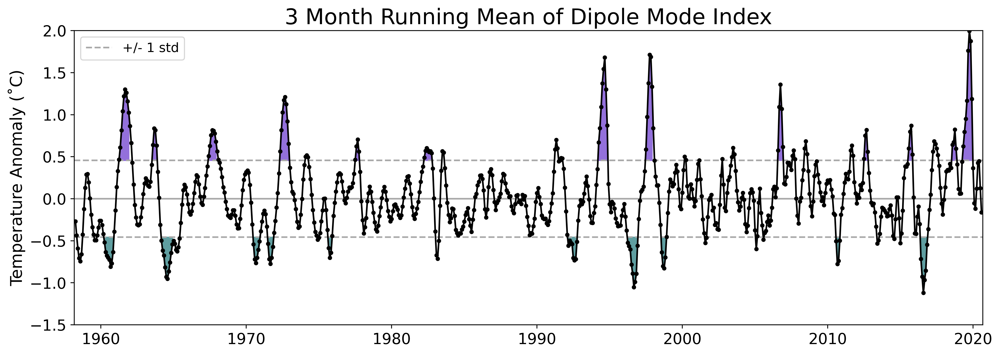

In [3]:
# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

# lists of positive iod years for now taken from sources above 1994-2018 unsure after 2016
posIODyears = list(np.array(ds_DMI.pos_IOD_years)) #[1994,1997,2006,2012,2015]
negIODyears = list(np.array(ds_DMI.neg_IOD_years)) #[1996,1998,2001,2010,2014,2016]
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) # [1995,1999,2000,2002,2003,2004,2005,2007,2008,2009,2011,2012,2013]

sposIODyears = list(np.array(ds_DMI.spos_IOD_years)) 
snegIODyears = list(np.array(ds_DMI.sneg_IOD_years)) 

wposIODyears = list(np.array(ds_DMI.wpos_IOD_years)) 
wnegIODyears = list(np.array(ds_DMI.wneg_IOD_years)) 


# plot before combining into one

params = {'legend.fontsize': 12,
         'axes.labelsize': 15,
         'axes.titlesize': 20,
         'xtick.labelsize':14,
         'ytick.labelsize':14}

pylab.rcParams.update(params)

fig = plt.figure(figsize=(15, 5), dpi = 400)
plt.axhline(y=0, color='darkgray', linestyle='-')
std1 = plt.axhline(y=ds_DMI.dmi_3mo_runmean.std(), color='darkgray', linestyle='--')
plt.axhline(y=-ds_DMI.dmi_3mo_runmean.std(), color='darkgray', linestyle='--')
# std2 = plt.axhline(y=ds_DMI.dmi_3mo_runmean.std()*2, color='lightblue', linestyle='--')
# plt.axhline(y=-ds_DMI.dmi_3mo_runmean.std()*1.5, color='lightblue', linestyle='--')
plt.plot(ds_DMI.time,ds_DMI.dmi_3mo_runmean, marker = '.',color='k')

for posyear in ds_DMI.pos_IOD_years:
    
    ind = ds_DMI.time.dt.year == posyear
    x = np.array(ds_DMI.time[ind])
    y2 = np.array(ds_DMI.dmi_3mo_runmean.std())
    y1 = np.array(ds_DMI.dmi_3mo_runmean[ind])
    
    plt.fill_between(x,y1,y2,where=y1 > y2,color = 'mediumpurple')
    
for negyear in ds_DMI.neg_IOD_years:
    
    ind = ds_DMI.time.dt.year == negyear
    x = np.array(ds_DMI.time[ind])
    y1 = -np.array(ds_DMI.dmi_3mo_runmean.std())
    y2 = np.array(ds_DMI.dmi_3mo_runmean[ind])
    
    plt.fill_between(x,y1,y2,where=y1 > y2,color = 'cadetblue')
# add_text(plt.gca(), str(len(ds_DMI.posyears)) + ' Postive IOD Years', x = 0.16,y=0.05, fontsize = 14)
# add_text(plt.gca(), str(len(ds_DMI.negyears)) + ' Negative IOD Years', x = 0.415,y=0.05, fontsize = 14)
# add_text(plt.gca(), str(len(ds_DMI.neuyears)) + ' Neutral IOD Years', x = 0.685,y=0.05, fontsize = 14)
plt.xlim(dt.date(1958,3,1),dt.date(2020,9,1))
plt.ylim([-1.5,2])
plt.ylabel('Temperature Anomaly (˚C)')
plt.title('3 Month Running Mean of Dipole Mode Index')

l = plt.legend([std1],['+/- 1 std'],facecolor = 'w', loc = 'upper left')


plt.savefig(figpath + 'Fig_SI_dmi.pdf', format='pdf', dpi = 400)

# 50-200m Empircal Cumulative Disitrbution Functions

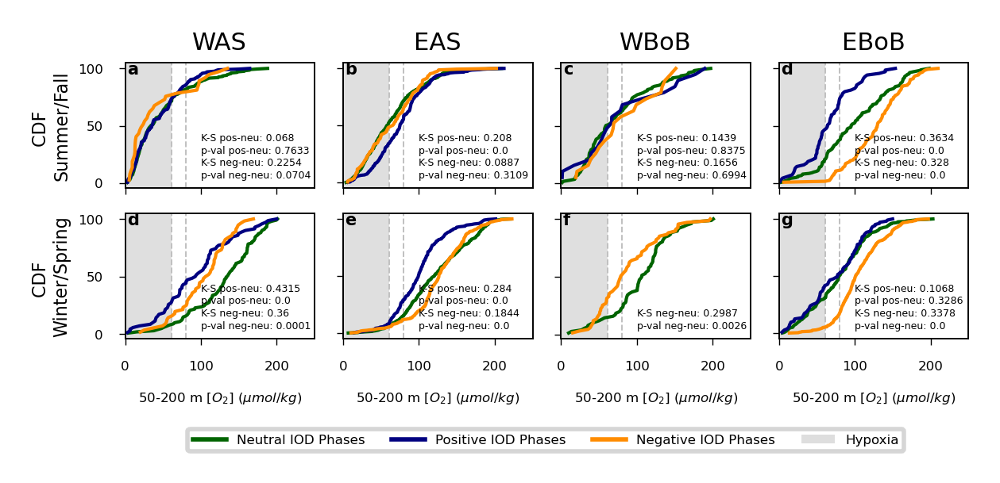

In [29]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '50_200'
Depth = '50-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')


# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}

pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Neutral IOD Phases','Positive IOD Phases','Negative IOD Phases','Strong Positive Phases']
letters = ['a','b','c','d','e','f','g','h']


regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]


cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
    # seasonal 
    tmp = np.sort(x1_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[0])
    
    # positive IOD
    tmp = np.sort(x2_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1])
    
    # negative IOD
    tmp = np.sort(x3_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[2])
    
    if cnt == 1:
        ax.set_ylabel('CDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,250])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x1_sf)>1) & (len(x2_sf)>1):
        add_text(ax, 'K-S pos-neu: ' + str(np.round(pos_all_ks_sf[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-neu: ' + str(np.round(pos_all_ks_sf[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        
    if (len(x1_sf)>1) & (len(x3_sf)>1):
        add_text(ax, 'K-S neg-neu: ' + str(np.round(neg_all_ks_sf[0],4)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'p-val neg-neu: ' + str(np.round(neg_all_ks_sf[1],4)), x = 0.4,y=0.08, fontsize = 2.25)
        

    

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', label = 'Hypoxia', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

    # seasonal 
    tmp = np.sort(x1_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[0], label = labels[0])

    # positive IOD
    tmp = np.sort(x2_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], label = labels[1])
    
    # negative IOD
    tmp = np.sort(x3_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[2], label = labels[2])
    
    
    ax.set_xlim([0,250])
    if cnt == 1:
        ax.set_ylabel('CDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)', fontsize = 3)
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x1_ws)>1) & (len(x2_ws)>1):
        add_text(ax, 'K-S pos-neu: ' + str(np.round(pos_all_ks_ws[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-neu: ' + str(np.round(pos_all_ks_ws[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        
    if (len(x1_ws)>1) & (len(x3_ws)>1):
        add_text(ax, 'K-S neg-neu: ' + str(np.round(neg_all_ks_ws[0],4)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'p-val neg-neu: ' + str(np.round(neg_all_ks_ws[1],4)), x = 0.4,y=0.08, fontsize = 2.25)
        
    cnt += 1

leg = ax.legend(loc='lower center', bbox_to_anchor=(-1.23, -.95),
          ncol=5, handlelength = 2.5)

for line in leg.get_lines():
    line.set_linewidth(1.0)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_SI_cdfs.pdf', format='pdf', dpi = 400)



# 50-200m Empirical Cumulative Distribution Functions for Only String Positive IOD Phases

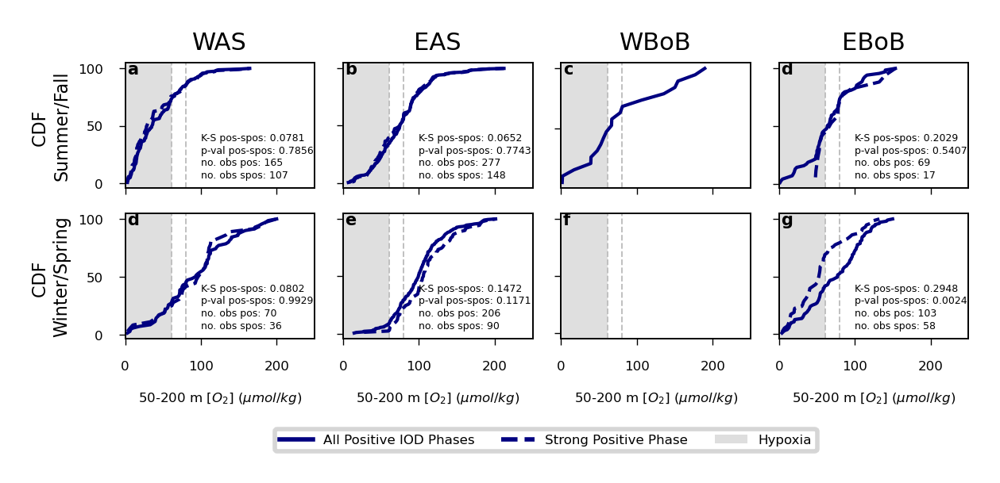

In [30]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '50_200'
Depth = '50-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,sposIOD_time_EBoB,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}

pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

# clrs = ['darkgreen','darkorange','navy','darkorchid', 'darkgreen']
clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Positive IOD Phases','Strong Positive Phases']
letters = ['a','b','c','d','e','f','g','h']


regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]



cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
   
    # positive IOD
    tmp = np.sort(x2_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1])
    
    # strong positive IOD 
    tmp = np.sort(x4_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1], linestyle = '--')

    
    if cnt == 1:
        ax.set_ylabel('CDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,250])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x2_sf)>1) & (len(x4_sf)>1):
        add_text(ax, 'K-S pos-spos: ' + str(np.round(pos_spos_ks_sf[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-spos: ' + str(np.round(pos_spos_ks_sf[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        add_text(ax, 'no. obs pos: ' + str(len(x2_sf)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'no. obs spos: ' + str(len(x4_sf)), x = 0.4,y=0.08, fontsize = 2.25)

    

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', label = 'Hypoxia', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

    # positive IOD
    tmp = np.sort(x2_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], label = 'All Positive IOD Phases')
   
    # strong positive IOD 
    tmp = np.sort(x4_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], linestyle = '--',label = 'Strong Positive Phase')
    
    ax.set_xlim([0,250])
    if cnt == 1:
        ax.set_ylabel('CDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)', fontsize = 3)
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x2_ws)>1) & (len(x4_ws)>1):
        add_text(ax, 'K-S pos-spos: ' + str(np.round(pos_spos_ks_ws[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-spos: ' + str(np.round(pos_spos_ks_ws[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        add_text(ax, 'no. obs pos: ' + str(len(x2_ws)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'no. obs spos: ' + str(len(x4_ws)), x = 0.4,y=0.08, fontsize = 2.25)

    cnt += 1

leg = ax.legend(loc='lower center', bbox_to_anchor=(-1.23, -.95),
          ncol=5, handlelength = 2.5)

for line in leg.get_lines():
    line.set_linewidth(1.0)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_SI_cdfs_sposiods.pdf', format='pdf', dpi = 400)




In [31]:
sposIOD_time_EBoB[~np.isnan(sposIODdata_eBoB)]

array(['1961-11-23T00:00:00.000000000', '1961-11-24T00:00:00.000000000',
       '1961-11-24T00:00:00.000000000', '1961-11-26T00:00:00.000000000',
       '1961-11-27T00:00:00.000000000', '1961-11-27T00:00:00.000000000',
       '1961-11-28T00:00:00.000000000', '1961-11-28T00:00:00.000000000',
       '1961-11-29T00:00:00.000000000', '1961-11-29T00:00:00.000000000',
       '1961-11-29T00:00:00.000000000', '1961-11-30T00:00:00.000000000',
       '1961-11-30T00:00:00.000000000', '1961-12-01T00:00:00.000000000',
       '1961-12-02T00:00:00.000000000', '1961-12-02T00:00:00.000000000',
       '1961-12-02T00:00:00.000000000', '1961-12-03T00:00:00.000000000',
       '1961-12-03T00:00:00.000000000', '1961-12-07T00:00:00.000000000',
       '1961-12-08T00:00:00.000000000', '1961-12-12T00:00:00.000000000',
       '1961-12-14T00:00:00.000000000', '1961-12-15T00:00:00.000000000',
       '1961-12-15T00:00:00.000000000', '1961-12-16T00:00:00.000000000',
       '1961-12-17T00:00:00.000000000', '1961-12-17

# Locations of oxygen profiles used and the number of oxygen observations per month during IOD phases

In [32]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '50_200'
Depth = '50-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,posIODlat_wAS,posIODlon_wAS,_,posIODmon_wAS,posIODseas_wAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,negIODlat_wAS,negIODlon_wAS,_,negIODmon_wAS,negIODseas_wAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,neuIODlat_wAS,neuIODlon_wAS,_,neuIODmon_wAS,neuIODseas_wAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,posIODlat_eAS,posIODlon_eAS,_,posIODmon_eAS,posIODseas_eAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,negIODlat_eAS,negIODlon_eAS,_,negIODmon_eAS,negIODseas_eAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,neuIODlat_eAS,neuIODlon_eAS,_,neuIODmon_eAS,neuIODseas_eAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,posIODlat_wBoB,posIODlon_wBoB,_,posIODmon_wBoB,posIODseas_wBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,negIODlat_wBoB,negIODlon_wBoB,_,negIODmon_wBoB,negIODseas_wBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,neuIODlat_wBoB,neuIODlon_wBoB,_,neuIODmon_wBoB,neuIODseas_wBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,posIODlat_eBoB,posIODlon_eBoB,_,posIODmon_eBoB,posIODseas_eBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,negIODlat_eBoB,negIODlon_eBoB,_,negIODmon_eBoB,negIODseas_eBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,neuIODlat_eBoB,neuIODlon_eBoB,_,neuIODmon_eBoB,neuIODseas_eBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')

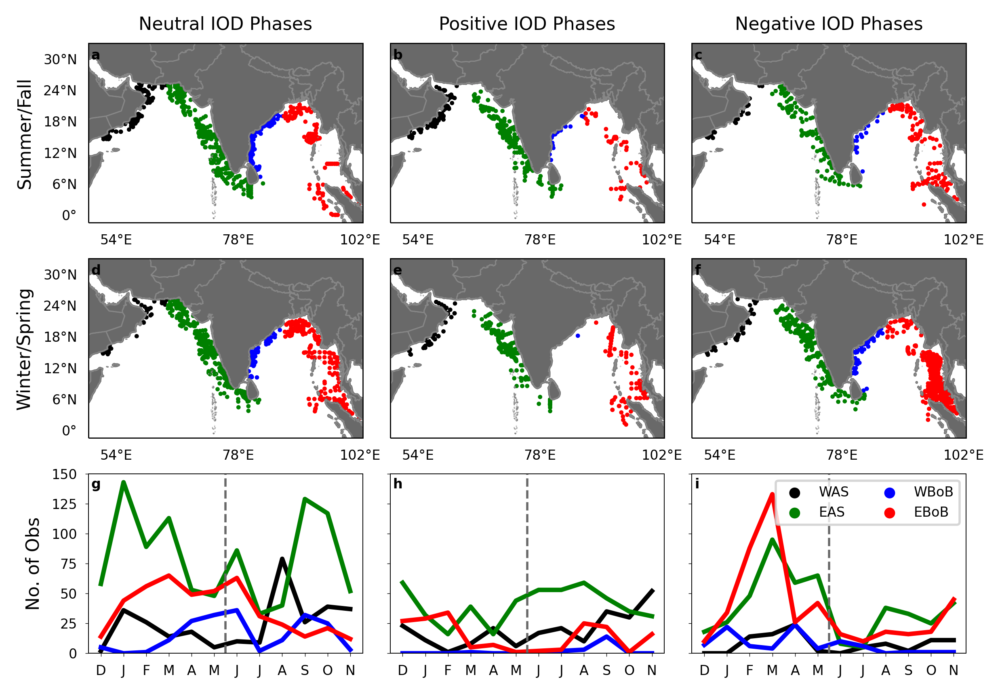

In [33]:
fig = plt.figure(figsize=(17.8/2.54,5),dpi=400)

sz = 15
sq_sz = 60
fsz = 12
alpha = 0.25
lfz = 6

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 6,
         'axes.labelsize': 8,
         'axes.titlesize': 8,
         'xtick.labelsize':6,
         'ytick.labelsize':6}

pylab.rcParams.update(params)

letters = ['a','b','c','d','e','f','g']
mons = ['D','J','F','M','A','M','J','J','A','S','O','N']
labels = ['WAS','EAS','WBoB','EBoB']

##############################################################
cnt = 1
for ss in range(1,-1,-1):
    ax = fig.add_subplot(3,3,cnt,projection= ccrs.PlateCarree())
    
    if ss == 1:
        ind = (neuIODseas_wAS == 'JJA') | (neuIODseas_wAS == 'SON')
    else:
        ind = (neuIODseas_wAS == 'DJF') | (neuIODseas_wAS == 'MAM')
        
    var = neuIODdata_wAS[ind]
    lat = neuIODlat_wAS[ind]
    lon = neuIODlon_wAS[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='k', marker = '.', 
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    if ss == 1:
        ind = (neuIODseas_eAS == 'JJA') | (neuIODseas_eAS == 'SON')
    else:
        ind = (neuIODseas_eAS == 'DJF') | (neuIODseas_eAS == 'MAM')
    var = neuIODdata_eAS[ind]
    lat = neuIODlat_eAS[ind]
    lon = neuIODlon_eAS[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='g', marker = '.',
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())

    if ss == 1:
        ind = (neuIODseas_wBoB == 'JJA') | (neuIODseas_wBoB == 'SON')
    else:
        ind = (neuIODseas_wBoB == 'DJF') | (neuIODseas_wBoB == 'MAM')
    var = neuIODdata_wBoB[ind]
    lat = neuIODlat_wBoB[ind]
    lon = neuIODlon_wBoB[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='b', marker = '.', 
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    if ss == 1:
        ind = (neuIODseas_eBoB == 'JJA') | (neuIODseas_eBoB == 'SON')
    else:
        ind = (neuIODseas_eBoB == 'DJF') | (neuIODseas_eBoB == 'MAM')
    var = neuIODdata_eBoB[ind]
    lat = neuIODlat_eBoB[ind]
    lon = neuIODlon_eBoB[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='r', marker = '.', 
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    if ss == 1:
        ax.set_title('Neutral IOD Phases')
        ylabel_map(ax,label = 'Summer/Fall', fontsize = 8, x = -.2)
    else:
        ylabel_map(ax,label = 'Winter/Spring', fontsize = 8, x = -.2)
    g = add_land(ax,bounds=cm_bounds, countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 6}
    g.ylabel_style = {'size': 6}
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)

    #----#
    ax = fig.add_subplot(3,3,cnt+1,projection= ccrs.PlateCarree())
    
    if ss == 1:
        ind = (posIODseas_wAS == 'JJA') | (posIODseas_wAS == 'SON')
    else:
        ind = (posIODseas_wAS == 'DJF') | (posIODseas_wAS == 'MAM')
        
    var = posIODdata_wAS[ind]
    lat = posIODlat_wAS[ind]
    lon = posIODlon_wAS[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='k', marker = '.',
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    if ss == 1:
        ind = (posIODseas_eAS == 'JJA') | (posIODseas_eAS == 'SON')
    else:
        ind = (posIODseas_eAS == 'DJF') | (posIODseas_eAS == 'MAM')
    var = posIODdata_eAS[ind]
    lat = posIODlat_eAS[ind]
    lon = posIODlon_eAS[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='g', marker = '.',
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())

    if ss == 1:
        ind = (posIODseas_wBoB == 'JJA') | (posIODseas_wBoB == 'SON')
    else:
        ind = (posIODseas_wBoB == 'DJF') | (posIODseas_wBoB == 'MAM')
    var = posIODdata_wBoB[ind]
    lat = posIODlat_wBoB[ind]
    lon = posIODlon_wBoB[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='b', marker = '.',
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    if ss == 1:
        ind = (posIODseas_eBoB == 'JJA') | (posIODseas_eBoB == 'SON')
    else:
        ind = (posIODseas_eBoB == 'DJF') | (posIODseas_eBoB == 'MAM')
    var = posIODdata_eBoB[ind]
    lat = posIODlat_eBoB[ind]
    lon = posIODlon_eBoB[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='r', marker = '.',
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    
    if ss == 1:
        ax.set_title('Positive IOD Phases')
    g = add_land(ax,bounds=cm_bounds, countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 6}
    g.ylabel_style = {'size': 6}
    g.ylabels_left = False
    add_letter(ax, letters[cnt], x = 0.01,y=0.91, fontsize = lfz)

    #----#
    ax = fig.add_subplot(3,3,cnt+2,projection= ccrs.PlateCarree())
   
    if ss == 1:
        ind = (negIODseas_wAS == 'JJA') | (negIODseas_wAS == 'SON')
    else:
        ind = (negIODseas_wAS == 'DJF') | (negIODseas_wAS == 'MAM')
        
    var = negIODdata_wAS[ind]
    lat = negIODlat_wAS[ind]
    lon = negIODlon_wAS[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='k', marker = '.', label = labels[0],
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    if ss == 1:
        ind = (negIODseas_eAS == 'JJA') | (negIODseas_eAS == 'SON')
    else:
        ind = (negIODseas_eAS == 'DJF') | (negIODseas_eAS == 'MAM')
    var = negIODdata_eAS[ind]
    lat = negIODlat_eAS[ind]
    lon = negIODlon_eAS[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='g', marker = '.',label = labels[1],
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())

    if ss == 1:
        ind = (negIODseas_wBoB == 'JJA') | (negIODseas_wBoB == 'SON')
    else:
        ind = (negIODseas_wBoB == 'DJF') | (negIODseas_wBoB == 'MAM')
    var = negIODdata_wBoB[ind]
    lat = negIODlat_wBoB[ind]
    lon = negIODlon_wBoB[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='b', marker = '.', label = labels[2],
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    if ss == 1:
        ind = (negIODseas_eBoB == 'JJA') | (negIODseas_eBoB == 'SON')
    else:
        ind = (negIODseas_eBoB == 'DJF') | (negIODseas_eBoB == 'MAM')
    var = negIODdata_eBoB[ind]
    lat = negIODlat_eBoB[ind]
    lon = negIODlon_eBoB[ind]
    ind = np.isnan(var)
    p = ax.scatter(lon[~ind],lat[~ind], c='r', marker = '.', label = labels[3],
                   edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
    
    
    if ss == 1:
        ax.set_title('Negative IOD Phases')
    g = add_land(ax,bounds = cm_bounds, countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 6}
    g.ylabel_style = {'size': 6}
    g.ylabels_left = False
    add_letter(ax, letters[cnt+1], x = 0.01,y=0.91, fontsize = lfz)

    cnt = cnt + 3
    
    
##################################################################################################    
# obs over time
##################################################################################################

ylim = [0,150]
lw = 2
#----#
ax = fig.add_subplot(337)

var = neuIODdata_wAS
ind = np.isnan(var)
lat = neuIODlat_wAS[~ind]
lon = neuIODlon_wAS[~ind]
mon = neuIODmon_wAS[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'k', lw = lw)

var = neuIODdata_eAS
ind = np.isnan(var)
lat = neuIODlat_eAS[~ind]
lon = neuIODlon_eAS[~ind]
mon = neuIODmon_eAS[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'g', lw = lw)

var = neuIODdata_wBoB
ind = np.isnan(var)
lat = neuIODlat_wBoB[~ind]
lon = neuIODlon_wBoB[~ind]
mon = neuIODmon_wBoB[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'b', lw = lw)

var = neuIODdata_eBoB
ind = np.isnan(var)
lat = neuIODlat_eBoB[~ind]
lon = neuIODlon_eBoB[~ind]
mon = neuIODmon_eBoB[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'r', lw = lw)

ax.axvline(x = 6.5, color = 'dimgray',linestyle = '--', lw = 1)
ax.set_ylabel('No. of Obs')
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(mons)
ax.set_ylim(ylim)
add_letter(ax, 'g', x = 0.01,y=0.92, fontsize = lfz)

#----#
ax = fig.add_subplot(338)

var = posIODdata_wAS
ind = np.isnan(var)
lat = posIODlat_wAS[~ind]
lon = posIODlon_wAS[~ind]
mon = posIODmon_wAS[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'k', lw = lw)

var = posIODdata_eAS
ind = np.isnan(var)
lat = posIODlat_eAS[~ind]
lon = posIODlon_eAS[~ind]
mon = posIODmon_eAS[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'g', lw = lw)

var = posIODdata_wBoB
ind = np.isnan(var)
lat = posIODlat_wBoB[~ind]
lon = posIODlon_wBoB[~ind]
mon = posIODmon_wBoB[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'b', lw = lw)

var = posIODdata_eBoB
ind = np.isnan(var)
lat = posIODlat_eBoB[~ind]
lon = posIODlon_eBoB[~ind]
mon = posIODmon_eBoB[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'r', lw = lw)

ax.axvline(x = 6.5, color = 'dimgray',linestyle = '--', lw = 1)
ax.set_yticklabels([])
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(mons)
ax.set_ylim(ylim)
add_letter(ax, 'h', x = 0.01,y=0.92, fontsize = lfz)

#----#
ax = fig.add_subplot(339)

var = negIODdata_wAS
ind = np.isnan(var)
lat = negIODlat_wAS[~ind]
lon = negIODlon_wAS[~ind]
mon = negIODmon_wAS[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'k', lw = lw)

var = negIODdata_eAS
ind = np.isnan(var)
lat = negIODlat_eAS[~ind]
lon = negIODlon_eAS[~ind]
mon = negIODmon_eAS[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'g', lw = lw)

var = negIODdata_wBoB
ind = np.isnan(var)
lat = negIODlat_wBoB[~ind]
lon = negIODlon_wBoB[~ind]
mon = negIODmon_wBoB[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'b', lw = lw)

var = negIODdata_eBoB
ind = np.isnan(var)
lat = negIODlat_eBoB[~ind]
lon = negIODlon_eBoB[~ind]
mon =negIODmon_eBoB[~ind]

mon_cnt = []
for tt in range(1,13):
    mon_cnt.append(np.nansum(mon == tt))

# roll so december is first
mon_cnt = np.array(mon_cnt)
mon_cnt = np.roll(mon_cnt,1)

p = ax.plot(np.arange(1,13), mon_cnt, color = 'r', lw = lw)

ax.axvline(x = 6.5, color = 'dimgray',linestyle = '--', lw = 1)
ax.set_yticklabels([])
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(mons)
ax.set_ylim(ylim)
add_letter(ax, 'i', x = 0.01,y=0.92, fontsize = lfz)


# legend
ax.scatter(np.nan,np.nan, c='k', marker = '.', label = labels[0],edgecolor = 'none',s = sz)
ax.scatter(np.nan,np.nan, c='g', marker = '.', label = labels[1],edgecolor = 'none',s = sz)
ax.scatter(np.nan,np.nan, c='b', marker = '.', label = labels[2],edgecolor = 'none',s = sz)
ax.scatter(np.nan,np.nan, c='r', marker = '.', label = labels[3],edgecolor = 'none',s = sz)
plt.legend(markerscale=2.5, ncol = 2, loc = 'upper right')


plt.subplots_adjust(wspace = 0.1)
plt.savefig(figpath + 'Fig_SI_o2_obs_loc_and_per_month_iod_phase.pdf', format='pdf', dpi = 400)

# S11 Temperature and Oxygen / Temperature and SLA Correlations

In [34]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# SLA
ds_SLA = xr.open_dataset('../data_processing/6_Regridding/sla_to_wod.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 


depth = '50_200'
Depth = '50-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
temp = ds_WOD['temp_wAS_' + depth]
po4 = ds_WOD['phosphate_wAS_' + depth]
no3 = ds_WOD['nitrate_wAS_' + depth]
sla = ds_SLA.sla_wAS
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
doxy_posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,posIODseas_wAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
temp_posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,posIODseas_wAS = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
sla_posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
po4_posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
no3_posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# negative IOD years -------------------------------------------# 
doxy_negIODdata_wAS,_,_,_,negIODmon_wAS,negIODseas_wAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')
temp_negIODdata_wAS,_,_,_,negIODmon_wAS,negIODseas_wAS = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')
sla_negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')
po4_negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')
no3_negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
doxy_neuIODdata_wAS,_,_,_,neuIODmon_wAS,neuIODseas_wAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')
temp_neuIODdata_wAS,_,_,_,neuIODmon_wAS,neuIODseas_wAS = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')
sla_neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')
po4_neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')
no3_neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
temp = ds_WOD['temp_eAS_' + depth]
po4 = ds_WOD['phosphate_eAS_' + depth]
no3 = ds_WOD['nitrate_eAS_' + depth]
sla = ds_SLA.sla_eAS
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
doxy_posIODdata_eAS,_,_,_,posIODmon_eAS,posIODseas_eAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')
temp_posIODdata_eAS,_,_,_,posIODmon_eAS,posIODseas_eAS = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')
sla_posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')
po4_posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')
no3_posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')
# negative IOD years -------------------------------------------# 
doxy_negIODdata_eAS,_,_,_,negIODmon_eAS,negIODseas_eAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')
temp_negIODdata_eAS,_,_,_,negIODmon_eAS,negIODseas_eAS = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')
sla_negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')
po4_negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')
no3_negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')
# neutral IOD years -------------------------------------------# 
doxy_neuIODdata_eAS,_,_,_,neuIODmon_eAS,neuIODseas_eAS = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')
temp_neuIODdata_eAS,_,_,_,neuIODmon_eAS,neuIODseas_eAS = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')
sla_neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')
po4_neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')
no3_neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
temp = ds_WOD['temp_wBoB_' + depth]
po4 = ds_WOD['phosphate_wBoB_' + depth]
no3 = ds_WOD['nitrate_wBoB_' + depth]
sla = ds_SLA.sla_wBoB
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
doxy_posIODdata_wBoB,_,_,_,posIODmon_wBoB,posIODseas_wBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
temp_posIODdata_wBoB,_,_,_,posIODmon_wBoB,posIODseas_wBoB = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
sla_posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
po4_posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
no3_posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
doxy_negIODdata_wBoB,_,_,_,negIODmon_wBoB,negIODseas_wBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')
temp_negIODdata_wBoB,_,_,_,negIODmon_wBoB,negIODseas_wBoB = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')
sla_negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')
po4_negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')
no3_negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')
# neutral IOD years -------------------------------------------# 
doxy_neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,neuIODseas_wBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')
temp_neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,neuIODseas_wBoB = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')
sla_neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')
po4_neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')
no3_neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')
############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
temp = ds_WOD['temp_eBoB_' + depth]
po4 = ds_WOD['phosphate_eBoB_' + depth]
no3 = ds_WOD['nitrate_eBoB_' + depth]
sla = ds_SLA.sla_eBoB
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
doxy_posIODdata_eBoB,_,_,_,posIODmon_eBoB,posIODseas_eBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
temp_posIODdata_eBoB,_,_,_,posIODmon_eBoB,posIODseas_eBoB = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
sla_posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
po4_posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
no3_posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
doxy_negIODdata_eBoB,_,_,_,negIODmon_eBoB,negIODseas_eBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')
temp_negIODdata_eBoB,_,_,_,negIODmon_eBoB,negIODseas_eBoB = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')
sla_negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')
po4_negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')
no3_negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')
# neutral IOD years -------------------------------------------# 
doxy_neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,neuIODseas_eBoB = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')
temp_neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,neuIODseas_eBoB = IOD_year_group_WOD(temp,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')
sla_neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(sla,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')
po4_neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(po4,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')
no3_neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(no3,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')



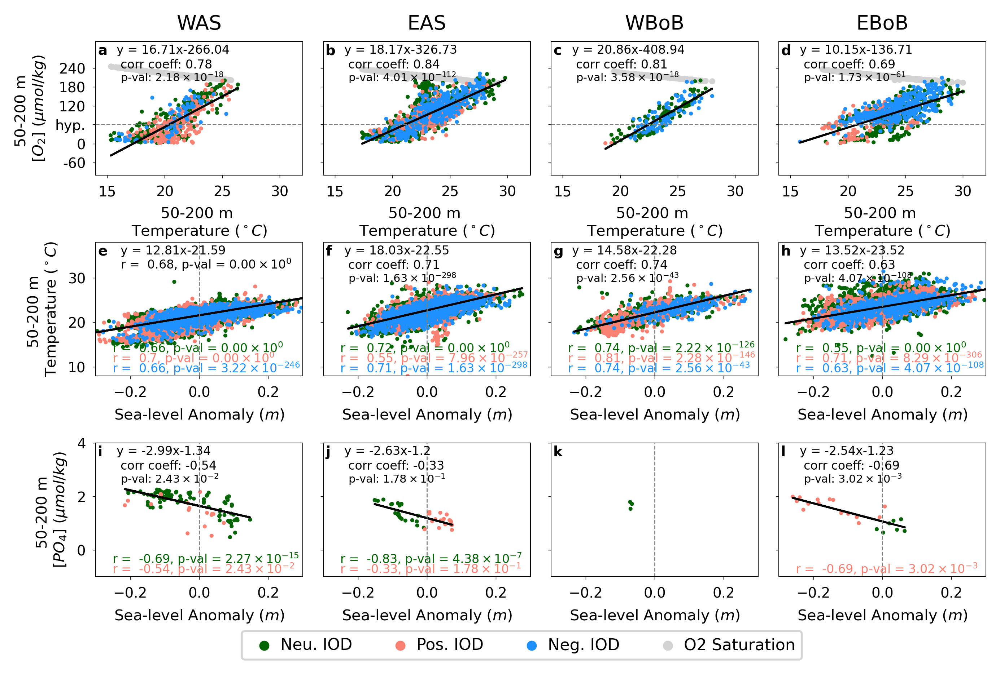

In [35]:

############################################################################
doxy_wAS = ds_WOD['doxy_wAS_' + depth]
doxy_eAS = ds_WOD['doxy_eAS_' + depth]
doxy_wBoB = ds_WOD['doxy_wBoB_' + depth]
doxy_eBoB = ds_WOD['doxy_eBoB_' + depth]

temp_wAS = ds_WOD['temp_wAS_' + depth]
temp_eAS = ds_WOD['temp_eAS_' + depth]
temp_wBoB = ds_WOD['temp_wBoB_' + depth]
temp_eBoB = ds_WOD['temp_eBoB_' + depth]

sla_wAS = ds_SLA['sla_wAS']
sla_eAS = ds_SLA['sla_eAS']
sla_wBoB = ds_SLA['sla_wBoB']
sla_eBoB = ds_SLA['sla_eBoB']

seas_wAS = ds_WOD['seas_wAS']
seas_eAS = ds_WOD['seas_eAS']
seas_wBoB = ds_WOD['seas_wBoB']
seas_eBoB = ds_WOD['seas_eBoB']

O2_sat_wAS = ds_WOD['sol_wAS_' + depth]
O2_sat_eAS = ds_WOD['sol_eAS_' + depth]
O2_sat_wBoB = ds_WOD['sol_wBoB_' + depth]
O2_sat_eBoB = ds_WOD['sol_eBoB_' + depth]

phosphate_wAS = ds_WOD['phosphate_wAS_' + depth]
phosphate_eAS = ds_WOD['phosphate_eAS_' + depth]
phosphate_wBoB = ds_WOD['phosphate_wBoB_' + depth]
phosphate_eBoB = ds_WOD['phosphate_eBoB_' + depth]

##############################################################
fig = plt.figure(figsize=(17.8 / 2.54,4.5),dpi=400)

sz = 4
fsz = 6
lfz = 7
lw = 1
alpha = 1


xlim = [14,32]
ylim = [-100,325]
x=0.08
y=0.5

regions = ['WAS','EAS','WBoB','EBoB']

cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
s_clr = '#c94c4c'
w_clr = '#034f84'
piod_clr = 'salmon'
ngiod_clr = 'dodgerblue'
niod_clr = 'darkgreen'
sat_clr = 'lightgray'

params = {'legend.fontsize': 5,
         'axes.labelsize': 7.5,
         'axes.titlesize': 10,
         'xtick.labelsize':7,
         'ytick.labelsize':7}

pylab.rcParams.update(params)

##############################################################

ax = fig.add_subplot(341)
box = ax.get_position()
box.y0 = box.y0 + y
ax.set_position(box)
var1 = temp_wAS
var2 = doxy_wAS
var3 = O2_sat_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
var3 = var3[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.scatter(var1,var3,c = sat_clr,s= sz)

# neu_iod
var1 = temp_neuIODdata_wAS
var2 = doxy_neuIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# pos_iod
var1 = temp_posIODdata_wAS
var2 = doxy_posIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# neg_iod
var1 = temp_negIODdata_wAS
var2 = doxy_negIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)


ax.set_title(regions[0])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_xlabel(Depth + ' m \nTemperature ($^\circ C$)')
ax.set_ylabel(Depth + ' m \n[$O_2$] ($\mu mol/ kg$)')
add_letter(ax, 'a', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(342)
box = ax.get_position()
box.y0 = box.y0 + y
ax.set_position(box)
var1 = temp_eAS
var2 = doxy_eAS
var3 = O2_sat_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
var3 = var3[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.scatter(var1,var3,c = sat_clr,s= sz)

# neu_iod
var1 = temp_neuIODdata_eAS
var2 = doxy_neuIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# pos_iod
var1 = temp_posIODdata_eAS
var2 = doxy_posIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# neg_iod
var1 = temp_negIODdata_eAS
var2 = doxy_negIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_title(regions[1])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel(Depth + ' m \nTemperature ($^\circ C$)')
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'b', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(343)
box = ax.get_position()
box.y0 = box.y0 + y
ax.set_position(box)
var1 = temp_wBoB
var2 = doxy_wBoB
var3 = O2_sat_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
var3 = var3[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.scatter(var1,var3,c = sat_clr,s= sz)

# neu_iod
var1 = temp_neuIODdata_wBoB
var2 = doxy_neuIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# pos_iod
var1 = temp_posIODdata_wBoB
var2 = doxy_posIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# neg_iod
var1 = temp_negIODdata_wBoB
var2 = doxy_negIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_title(regions[2])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel(Depth + ' m \nTemperature ($^\circ C$)')
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'c', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(344)
box = ax.get_position()
box.y0 = box.y0 + y
ax.set_position(box)
var1 = temp_eBoB
var2 = doxy_eBoB
var3 = O2_sat_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
var3 = var3[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.scatter(var1,var3,c = sat_clr,s= sz)

# neu_iod
var1 = temp_neuIODdata_eBoB
var2 = doxy_neuIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# pos_iod
var1 = temp_posIODdata_eBoB
var2 = doxy_posIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# neg_iod
var1 = temp_negIODdata_eBoB
var2 = doxy_negIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.set_title(regions[3])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel(Depth + ' m \nTemperature ($^\circ C$)')
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'd', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

#####################################################################
##################### TEMP vs SLA ############################
#####################################################################
ylim = [8,38]
xlim = [-0.3,0.3]

ax = fig.add_subplot(345)
var1 = sla_wAS
var2 = temp_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)

add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.12,y=0.91, fontsize = fsz)
add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = 0.12,y=0.8, fontsize = fsz)


# neu_iod
var1 = sla_neuIODdata_wAS
var2 = temp_neuIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.175, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_wAS
var2 = temp_posIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')


add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.1, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_wAS
var2 = temp_negIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')


add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \nTemperature ($^\circ C$)')
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'e', x = 0.01,y=0.9, fontsize = lfz)

ax = fig.add_subplot(346)
var1 = sla_eAS
var2 = temp_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)

# neu_iod
var1 = sla_neuIODdata_eAS
var2 = temp_neuIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.175, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_eAS
var2 = temp_posIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.1, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_eAS
var2 = temp_negIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'f', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(347)
var1 = sla_wBoB
var2 = temp_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)

# neu_iod
var1 = sla_neuIODdata_wBoB
var2 = temp_neuIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.175, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_wBoB
var2 = temp_posIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')


add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.1, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_wBoB
var2 = temp_negIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'g', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(348)
var1 = sla_eBoB
var2 = temp_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)


# neu_iod
var1 = sla_neuIODdata_eBoB
var2 = temp_neuIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.175, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_eBoB
var2 = temp_posIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.1, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_eBoB
var2 = temp_negIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'h', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

#####################################################################
##################### PHOSPHATE ############################
#####################################################################
ylim = [-1,4]

ax = fig.add_subplot(349)
var1 = sla_wAS
var2 = phosphate_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)

# neu_iod
var1 = sla_neuIODdata_wAS
var2 = po4_neuIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.1, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_wAS
var2 = po4_posIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_wAS
var2 = po4_negIODdata_wAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \n[$PO_4$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'i', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(3,4,10)
var1 = sla_eAS
var2 = phosphate_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)


# neu_iod
var1 = sla_neuIODdata_eAS
var2 = po4_neuIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.1, fontsize = fsz, color=niod_clr)
# pos_iod
var1 = sla_posIODdata_eAS
var2 = po4_posIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_eAS
var2 = po4_negIODdata_eAS
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'j', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(3,4,11)
var1 = sla_wBoB
var2 = phosphate_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, 'k', linewidth = lw)

# neu_iod
var1 = sla_neuIODdata_wBoB
var2 = po4_neuIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.1, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_wBoB
var2 = po4_posIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.025, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_wBoB
var2 = po4_negIODdata_wBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'k', x = 0.01,y=0.9, fontsize = lfz)
# add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
# add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
# add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(3,4,12)
var1 = sla_eBoB
var2 = phosphate_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)

# neu_iod
var1 = sla_neuIODdata_eBoB
var2 = po4_neuIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, niod_clr, linewidth = lw)
ax.scatter(var1,var2,c = niod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.1, fontsize = fsz, color=niod_clr)

# pos_iod
var1 = sla_posIODdata_eBoB
var2 = po4_posIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, piod_clr, linewidth = lw)
ax.scatter(var1,var2,c = piod_clr, s= sz,alpha = alpha, edgecolor = 'none')

add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
         x = x,y=0.025, fontsize = fsz, color=piod_clr)

# neg_iod
var1 = sla_negIODdata_eBoB
var2 = po4_negIODdata_eBoB
ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, ngiod_clr, linewidth = lw)
ax.scatter(var1,var2,c = ngiod_clr, s= sz,alpha = alpha, edgecolor = 'none')

# add_text(ax, 'r =  ' + str(np.round(r,2))+', p-val = ' + r'${0:s}$'.format(as_si(p_val,2)), 
#          x = 0.12,y=0.025, fontsize = fsz, color=ngiod_clr)

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'l', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

##############################################################
ax.scatter(np.nan,np.nan,c = niod_clr, s= sz, edgecolor = 'none', label = 'Neu. IOD')
ax.scatter(np.nan,np.nan,c = piod_clr, s= sz, edgecolor = 'none', label = 'Pos. IOD')
ax.scatter(np.nan,np.nan,c = ngiod_clr, s= sz, edgecolor = 'none', label = 'Neg. IOD')
ax.scatter(np.nan,np.nan,c = sat_clr, s= sz, edgecolor = 'none', label = 'O2 Saturation')
plt.legend(loc = 'lower right', handletextpad = 0.001, markerscale = 2.5,
          bbox_to_anchor=(0.15, -.68), ncol = 4, fontsize = 8)

plt.subplots_adjust(wspace = 0.1,hspace = 0.5, top = 0.95, bottom = 0.125, left = 0.1, right = 0.98)

plt.savefig(figpath + 'Fig_SI_corr_sla_temp_and_phos_doxy_temp_and_sol.pdf', format='pdf', dpi = 400)

# Locations of Observations used in Correlations

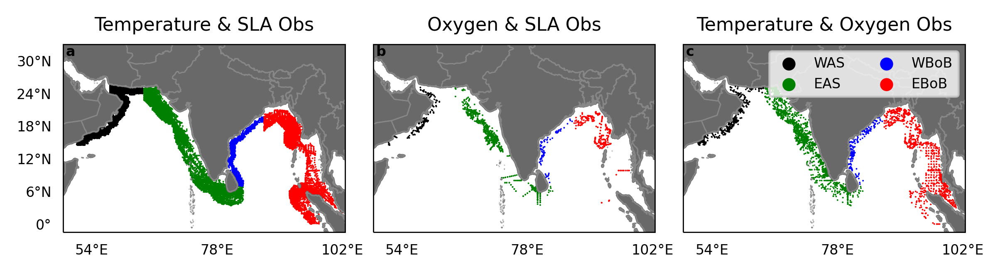

In [36]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# SLA
ds_SLA = xr.open_dataset('../data_processing/6_Regridding/sla_to_wod.nc')

depth = '50_200'
Depth = '50-200'
############################################################################
doxy_wAS = ds_WOD['doxy_wAS_' + depth]
doxy_eAS = ds_WOD['doxy_eAS_' + depth]
doxy_wBoB = ds_WOD['doxy_wBoB_' + depth]
doxy_eBoB = ds_WOD['doxy_eBoB_' + depth]

sla_wAS = ds_SLA['sla_wAS']
sla_eAS = ds_SLA['sla_eAS']
sla_wBoB = ds_SLA['sla_wBoB']
sla_eBoB = ds_SLA['sla_eBoB']

seas_wAS = ds_WOD['seas_wAS']
seas_eAS = ds_WOD['seas_eAS']
seas_wBoB = ds_WOD['seas_wBoB']
seas_eBoB = ds_WOD['seas_eBoB']

temp_wAS = ds_WOD['temp_wAS_' + depth]
temp_eAS = ds_WOD['temp_eAS_' + depth]
temp_wBoB = ds_WOD['temp_wBoB_' + depth]
temp_eBoB = ds_WOD['temp_eBoB_' + depth]

lat_wAS = ds_SLA['lat_wAS']
lat_eAS = ds_SLA['lat_eAS']
lat_wBoB = ds_SLA['lat_wBoB']
lat_eBoB = ds_SLA['lat_eBoB']

lon_wAS = ds_SLA['lon_wAS']
lon_eAS = ds_SLA['lon_eAS']
lon_wBoB = ds_SLA['lon_wBoB']
lon_eBoB = ds_SLA['lon_eBoB']
##############################################################
fig = plt.figure(figsize=(17.8/2.54,1.5),dpi=400)

sz = 2
sq_sz = 60
fsz = 12
alpha = 0.25
lfz = 6

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 6,
         'axes.labelsize': 8,
         'axes.titlesize': 8,
         'xtick.labelsize':6,
         'ytick.labelsize':6}

pylab.rcParams.update(params)

##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
ind = np.isnan(sla_wAS) | np.isnan(temp_wAS)
p = ax.scatter(lon_wAS[~ind],lat_wAS[~ind], c='k', marker = '.', 
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_eAS) | np.isnan(temp_eAS)
p = ax.scatter(lon_eAS[~ind],lat_eAS[~ind], c='g', marker = '.',
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(lon_wBoB[~ind],lat_wBoB[~ind], c='b', marker = '.', 
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_eBoB) | np.isnan(temp_eBoB)
p = ax.scatter(lon_eBoB[~ind],lat_eBoB[~ind], c='r', marker = '.', 
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ax.set_title('Temperature & SLA Obs')
g = add_land(ax,bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 6}
g.ylabel_style = {'size': 6}
add_letter(ax, 'a', x = 0.01,y=0.94, fontsize = lfz)

ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ind = np.isnan(sla_wAS) | np.isnan(doxy_wAS)
p = ax.scatter(lon_wAS[~ind],lat_wAS[~ind], c='k',marker = '.',
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_eAS) | np.isnan(doxy_eAS)
p = ax.scatter(lon_eAS[~ind],lat_eAS[~ind], c='g',marker = '.',
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_wBoB) | np.isnan(doxy_wBoB)
p = ax.scatter(lon_wBoB[~ind],lat_wBoB[~ind], c='b', marker = '.', 
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_eBoB) | np.isnan(doxy_eBoB)
lep = ax.scatter(lon_eBoB[~ind],lat_eBoB[~ind], c='r', marker = '.', 
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree())
ax.set_title('Oxygen & SLA Obs')
g = add_land(ax,bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 6}
g.ylabel_style = {'size': 6}
g.ylabels_left = False
add_letter(ax, 'b', x = 0.01,y=0.94, fontsize = lfz)

ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
ind = np.isnan(doxy_wAS) | np.isnan(temp_wAS)
p = ax.scatter(lon_wAS[~ind],lat_wAS[~ind], c='k', marker = '.',
               edgecolor = 'none', s = sz,transform=ccrs.PlateCarree(), label = 'WAS')
ind = np.isnan(doxy_eAS) | np.isnan(temp_eAS)
p = ax.scatter(lon_eAS[~ind],lat_eAS[~ind], c='g',  marker = '.',
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree(), label = 'EAS')
ind = np.isnan(doxy_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(lon_wBoB[~ind],lat_wBoB[~ind], c='b',  marker = '.',
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree(), label = 'WBoB')
ind = np.isnan(doxy_eBoB) | np.isnan(temp_eBoB)
p = ax.scatter(lon_eBoB[~ind],lat_eBoB[~ind], c='r',  marker = '.',
               edgecolor = 'none',s = sz,transform=ccrs.PlateCarree(), label = 'EBoB')
ax.set_title('Temperature & Oxygen Obs')
g = add_land(ax,bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 6}
g.ylabel_style = {'size': 6}
g.ylabels_left = False
add_letter(ax, 'c', x = 0.01,y=0.94, fontsize = lfz)

plt.subplots_adjust(wspace = 0.1)
plt.legend(markerscale=8, ncol = 2, loc = 'upper right')

plt.savefig(figpath + 'Fig_SI_sla_corr_doxy_temp_loc_map.pdf', format='pdf', dpi = 400)

# 40-200m Hypoxia Bar Plot

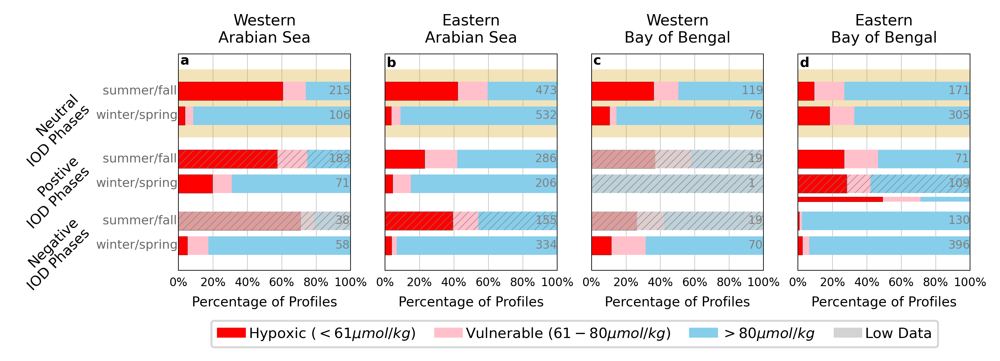

In [37]:
depth = '40_200'
Depth = '40-200'

ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')
# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')


##############################################
low_data = 40

import warnings
warnings.filterwarnings('ignore')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
letters = ['a','b','c','d','e','f']
x = [1,2,3,4]

fig = plt.figure(figsize=(17.8 / 2.54, 2.5), dpi=400)
# ax2 = fig.add_subplot(2,1,1); ax2.yaxis.grid(color='gainsboro');ax2.set_axisbelow(True) 
# ax3 = fig.add_subplot(2,1,2); ax3.yaxis.grid(color='gainsboro');ax3.set_axisbelow(True) 

params = {'legend.fontsize': 7.5,
         'axes.labelsize': 7,
         'axes.titlesize': 8,
         'xtick.labelsize':6,
         'ytick.labelsize':6,
         'hatch.color': 'gray',
          'hatch.linewidth': 0.25,
          'axes.linewidth':0.35,
         'xtick.major.width':0,
         'xtick.major.size':0,
         'ytick.major.width':0,
         'ytick.major.size':0}

pylab.rcParams.update(params)

lw = 0.1
text_fz = 6
sq_sz = 20
lfz = 7
height = 0.3
baralpha = 0.75
cmap = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#D3D3D3','#DcDcDc','#F0F0F0'],
                           [0,0.4,0.6,0.8,0.9,1])

clrs = ['red','pink','skyblue']

cmap = plt.cm.PuOr_r
cmin = -0.15
cmax = 0.15

regions = ['Western\nArabian Sea','Eastern\nArabian Sea','Western\nBay of Bengal','Eastern\nBay of Bengal']
ylabels = ['Negative\nIOD Phases','Postive\nIOD Phases','Neutral\nIOD Phases']
llabels = ['Hypoxic ($<61 \mu mol/kg$)', 'Vulnerable ($61-80 \mu mol/kg$)','$>80 \mu mol/kg$','Low Data']

####################################################################################################
# Bar Charts
####################################################################################################
# data_wAS = [ds_WOD.doxy_wAS_50_200,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
# data_eAS = [ds_WOD.doxy_eAS_50_200,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
# data_wBoB = [ds_WOD.doxy_wBoB_50_200,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
# data_eBoB = [ds_WOD.doxy_eBoB_50_200,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

# time_data_wAS = [ds_WOD.mon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
# time_data_eAS = [ds_WOD.mon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
# time_data_wBoB = [ds_WOD.mon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
# time_data_eBoB = [ds_WOD.mon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]

for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]
    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)
    

    # 80
    seas_hyp_c_sf = np.round(np.sum(x1_sf<80)/len(x1_sf)*100,2)
    piod_hyp_c_sf = np.round(np.sum(x2_sf<80)/len(x2_sf)*100,2)
    niod_hyp_c_sf = np.round(np.sum(x3_sf<80)/len(x3_sf)*100,2)
    spiod_hyp_c_sf = np.round(np.sum(x4_sf<80)/len(x4_sf)*100,2)
    
    # 61
    seas_hyp_sf = np.round(np.sum(x1_sf<61)/len(x1_sf)*100,2)
    piod_hyp_sf = np.round(np.sum(x2_sf<61)/len(x2_sf)*100,2)
    niod_hyp_sf = np.round(np.sum(x3_sf<61)/len(x3_sf)*100,2)
    spiod_hyp_sf = np.round(np.nansum(x4_sf<61)/len(x4_sf)*100,2)
    
    # close to hypoxic 
    seas_hyp_c_ws = np.round(np.sum(x1_ws<80)/len(x1_ws)*100,2)
    piod_hyp_c_ws = np.round(np.sum(x2_ws<80)/len(x2_ws)*100,2)
    niod_hyp_c_ws = np.round(np.sum(x3_ws<80)/len(x3_ws)*100,2)
    spiod_hyp_c_ws = np.round(np.sum(x4_ws<80)/len(x4_ws)*100,2)

    # percents 
    seas_hyp_ws = np.round(np.sum(x1_ws<61)/len(x1_ws)*100,2)
    piod_hyp_ws = np.round(np.sum(x2_ws<61)/len(x2_ws)*100,2)
    niod_hyp_ws = np.round(np.sum(x3_ws<61)/len(x3_ws)*100,2)
    spiod_hyp_ws = np.round(np.sum(x4_ws<61)/len(x4_ws)*100,2)

    ax = fig.add_subplot(1,4,pp+1)
    ax.grid(axis='x', which='both', linewidth = 0.25)
    ax.set_axisbelow(True)

    ############# seasonal ##########################################
    y1 = 3.2
    y2 = 2.8
    
    ax.axhspan(y1+.35, y2-.35,color='goldenrod',alpha=0.3, linewidth = 0)
    
    # ---- s/f ----------------------------------------------#
    ax.barh(y1,width = 100, height = height,color=clrs[2], align='center')
    ax.barh(y1,width = seas_hyp_c_sf,height = height,color=clrs[1], align='center')
    ax.barh(y1,width = seas_hyp_sf,height = height,color=clrs[0], align='center',
            edgecolor='k', linewidth = lw)
    
    # low data
    if len(x1_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
            
    # no obs/season
    if len(x1_sf) < 100:
        ax.text(91,y1-.05,'%d' % len(x1_sf),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y1-.05,'%d' % len(x1_sf),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-44,y1-.05,'summer/fall',fontsize = text_fz+0.5, color = 'dimgray')
    
    # ---- w/s ----------------------------------------------#
    ax.barh(y2,width = 100, height = height,color=clrs[2], align='center')
    ax.barh(y2,width = seas_hyp_c_ws,height = height,color=clrs[1], align='center',)
    ax.barh(y2,width = seas_hyp_ws,height = height,color=clrs[0], align='center',
            edgecolor='k', linewidth = lw)
    
    # low data
    if len(x1_ws)<low_data:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
        
    # no obs/season
    if len(x1_ws) < 100:
        ax.text(91,y2-.05,'%d' % len(x1_ws),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y2-.05,'%d' % len(x1_ws),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-48,y2-.05,'winter/spring',fontsize = text_fz+0.5, color = 'dimgray')
    
    ############# positive IODs ##########################################
    y1 = 2.1
    y2 = 1.7
    
    # ---- s/f ----------------------------------------------#
    # cdf pvals
    if pos_all_ks_sf[1] > 0.05:
        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y1,width = piod_hyp_c_sf,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y1,width = piod_hyp_sf,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y1,width = piod_hyp_sf,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)

    else:
        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y1,width = piod_hyp_c_sf,height = height,color=clrs[1], align='center',)
        ax.barh(y1,width = piod_hyp_sf,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', alpha = baralpha)
    
    # no obs/season
    if len(x2_sf) < 100:
        ax.text(91, y1-.05,'%d' % len(x2_sf),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y1-.05,'%d' % len(x2_sf),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-44,y1-.05,'summer/fall',fontsize = text_fz+0.5, color = 'dimgray')
    
    # ---- w/s ----------------------------------------------#
    
    # cdfs pval winter
    if pos_all_ks_ws[1] > 0.05:
        
        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y2,width = piod_hyp_c_ws,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y2,width = piod_hyp_ws,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y2,width = piod_hyp_ws,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_ws)<low_data:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
    else:
        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y2,width = piod_hyp_c_ws,height = height,color=clrs[1], align='center',)
        ax.barh(y2,width = piod_hyp_ws,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_ws)<low_data:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', alpha = baralpha)
        
    # strong positive IOD
    if pp == 3:
        ax.barh(y2-height/2-0.1,width = 100, height = height/4,color=clrs[2], align='center')
        ax.barh(y2-height/2-0.1,width = spiod_hyp_c_ws,height = height/4,color=clrs[1], align='center',)
        ax.barh(y2-height/2-0.1,width = spiod_hyp_ws,height = height/4,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        # low data
        if len(x4_ws)<low_data:
            ax.barh(y2-height/2-0.1,width = 100, height = height/4,color='lightgray', 
                    align='center', alpha = baralpha)
        
    # no obs/season
    if len(x2_ws) < 100:
        ax.text(91,y2-.05,'%d' % len(x2_ws),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y2-.05,'%d' % len(x2_ws),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-48,y2-.05,'winter/spring',fontsize = text_fz+0.5, color = 'dimgray')
    
    ############# Negative IODs ##########################################
    y1 = 1.1
    y2 = 0.7
    
    # ---- s/f ----------------------------------------------#
    
    # cdfs pval summer
    if neg_all_ks_sf[1] > 0.05:
            
        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y1,width = niod_hyp_c_sf,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y1,width = niod_hyp_sf,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y1,width = niod_hyp_sf,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x3_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)

    else:

        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y1,width = niod_hyp_c_sf,height = height,color=clrs[1], align='center',)
        ax.barh(y1,width = niod_hyp_sf,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
    
        # low data
        if len(x3_sf)<low_data:
                ax.barh(y1,width = 100, height = height,color='lightgray', 
                        align='center', hatch = '//////', alpha = baralpha)
          
    # no obs/season
    if len(x3_sf) < 100:
        ax.text(91,y1-.05,'%d' % len(x3_sf),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y1-.05,'%d' % len(x3_sf),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-44,y1-.05,'summer/fall',fontsize = text_fz+0.5, color = 'dimgray')
    
    # ---- w/s ----------------------------------------------#
    # cdf pvals winter
    if neg_all_ks_ws[1] > 0.05:

        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y2,width = niod_hyp_c_ws,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y2,width = niod_hyp_ws,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y2,width = niod_hyp_ws,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x3_ws)<20:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
    else:
        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y2,width = niod_hyp_c_ws,height = height,color=clrs[1], align='center',)
        ax.barh(y2,width = niod_hyp_ws,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x3_ws)<20:
            ax.barh(y2,width = 100, height = height,color='lightgray',
                    align='center', hatch = '//////', alpha = baralpha)
        
    # no obs/season
    if len(x3_ws) < 100:
        ax.text(91,y2-.05,'%d' % len(x3_ws),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y2-.05,'%d' % len(x3_ws),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-48,y2-.05,'winter/spring',fontsize = text_fz+0.5, color = 'dimgray')
        
#     if pp == 3:
#         ax.set_xlabel('Percentage of Oxygen Profiles')
    ax.set_title(regions[pp])
    if pp == 0:
        ax.set_yticks([1,2,3])
        ax.set_yticklabels(ylabels,fontsize = 7.5)
        ax.tick_params(axis='y', which='major', pad=45)
    else:
        ax.set_yticks([])
        
#     ax.set_xticks([0,25,50,75,100])
    ax.set_xticks([0,20,40,60,80,100])
    ax.set_xticklabels(['0%','20%','40%','60%','80%','100%'])
    ax.set_xlim([0,100])
    ax.set_ylim([0.3,3.8])
    if (pp == 0) | (pp == 2):
        add_letter(ax, letters[pp], x = 0.01,y=0.95, fontsize = lfz)
#         add_text(ax,regions[pp],x=.05,y=.9,fontsize = lfz)
    else:
        add_letter(ax, letters[pp], x = 0.01,y=0.94, fontsize = lfz)
#         add_text(ax,regions[pp],x=.05,y=.89,fontsize = lfz)
    plt.yticks(rotation=45)
    plt.yticks(rotation=45)
    ax.set_xlabel('Percentage of Profiles')

    
    if pp == 0:
        ax.barh(0.8,width = 0,height = height,color=clrs[0], align='center', label = llabels[0])
        ax.barh(0.8,width = 0,height = height,color=clrs[1], align='center', label = llabels[1])
        ax.barh(0.8,width = 0, height = height,color=clrs[2], align='center', label = llabels[2])
        ax.barh(0.8,width = 0, height = height,color='lightgray', align='center', label = llabels[3])
        plt.legend(ncol = 4,bbox_to_anchor=(4.455, -0.2), handletextpad = 0.2,
                  columnspacing = 1.3)
      
plt.subplots_adjust(hspace = 0.07,left = 0.16, bottom = 0.25, right = 0.98)

plt.savefig(figpath + 'Fig_SI_hypoxia_'+Depth+'.pdf', format='pdf', dpi = 400)


# 50-225m Hypoxia Bar Plot

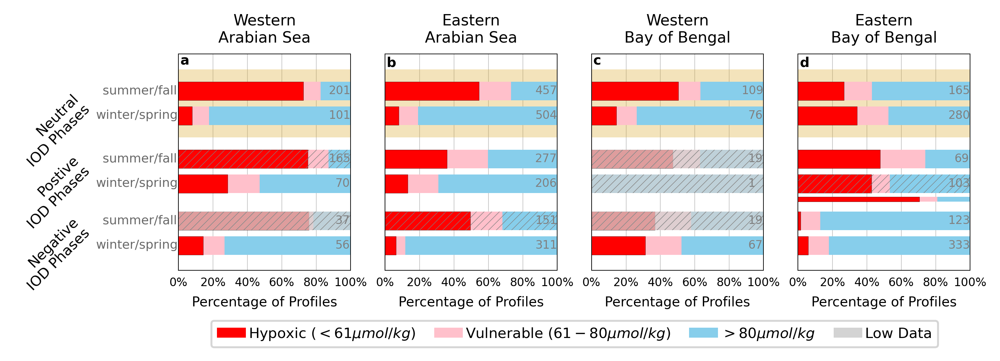

In [38]:
depth = '50_225'
Depth = '50-225'

ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')
# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')


##############################################
low_data = 40

import warnings
warnings.filterwarnings('ignore')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
letters = ['a','b','c','d','e','f']
x = [1,2,3,4]

fig = plt.figure(figsize=(17.8 / 2.54, 2.5), dpi=400)
# ax2 = fig.add_subplot(2,1,1); ax2.yaxis.grid(color='gainsboro');ax2.set_axisbelow(True) 
# ax3 = fig.add_subplot(2,1,2); ax3.yaxis.grid(color='gainsboro');ax3.set_axisbelow(True) 

params = {'legend.fontsize': 7.5,
         'axes.labelsize': 7,
         'axes.titlesize': 8,
         'xtick.labelsize':6,
         'ytick.labelsize':6,
         'hatch.color': 'gray',
          'hatch.linewidth': 0.25,
          'axes.linewidth':0.35,
         'xtick.major.width':0,
         'xtick.major.size':0,
         'ytick.major.width':0,
         'ytick.major.size':0}

pylab.rcParams.update(params)

lw = 0.1
text_fz = 6
sq_sz = 20
lfz = 7
height = 0.3
baralpha = 0.75
cmap = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#D3D3D3','#DcDcDc','#F0F0F0'],
                           [0,0.4,0.6,0.8,0.9,1])

clrs = ['red','pink','skyblue']

cmap = plt.cm.PuOr_r
cmin = -0.15
cmax = 0.15

regions = ['Western\nArabian Sea','Eastern\nArabian Sea','Western\nBay of Bengal','Eastern\nBay of Bengal']
ylabels = ['Negative\nIOD Phases','Postive\nIOD Phases','Neutral\nIOD Phases']
llabels = ['Hypoxic ($<61 \mu mol/kg$)', 'Vulnerable ($61-80 \mu mol/kg$)','$>80 \mu mol/kg$','Low Data']

####################################################################################################
# Bar Charts
####################################################################################################
# data_wAS = [ds_WOD.doxy_wAS_50_200,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
# data_eAS = [ds_WOD.doxy_eAS_50_200,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
# data_wBoB = [ds_WOD.doxy_wBoB_50_200,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
# data_eBoB = [ds_WOD.doxy_eBoB_50_200,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

# time_data_wAS = [ds_WOD.mon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
# time_data_eAS = [ds_WOD.mon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
# time_data_wBoB = [ds_WOD.mon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
# time_data_eBoB = [ds_WOD.mon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]

for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]
    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)
    

    # 80
    seas_hyp_c_sf = np.round(np.sum(x1_sf<80)/len(x1_sf)*100,2)
    piod_hyp_c_sf = np.round(np.sum(x2_sf<80)/len(x2_sf)*100,2)
    niod_hyp_c_sf = np.round(np.sum(x3_sf<80)/len(x3_sf)*100,2)
    spiod_hyp_c_sf = np.round(np.sum(x4_sf<80)/len(x4_sf)*100,2)
    
    # 61
    seas_hyp_sf = np.round(np.sum(x1_sf<61)/len(x1_sf)*100,2)
    piod_hyp_sf = np.round(np.sum(x2_sf<61)/len(x2_sf)*100,2)
    niod_hyp_sf = np.round(np.sum(x3_sf<61)/len(x3_sf)*100,2)
    spiod_hyp_sf = np.round(np.nansum(x4_sf<61)/len(x4_sf)*100,2)
    
    # close to hypoxic 
    seas_hyp_c_ws = np.round(np.sum(x1_ws<80)/len(x1_ws)*100,2)
    piod_hyp_c_ws = np.round(np.sum(x2_ws<80)/len(x2_ws)*100,2)
    niod_hyp_c_ws = np.round(np.sum(x3_ws<80)/len(x3_ws)*100,2)
    spiod_hyp_c_ws = np.round(np.sum(x4_ws<80)/len(x4_ws)*100,2)

    # percents 
    seas_hyp_ws = np.round(np.sum(x1_ws<61)/len(x1_ws)*100,2)
    piod_hyp_ws = np.round(np.sum(x2_ws<61)/len(x2_ws)*100,2)
    niod_hyp_ws = np.round(np.sum(x3_ws<61)/len(x3_ws)*100,2)
    spiod_hyp_ws = np.round(np.sum(x4_ws<61)/len(x4_ws)*100,2)

    ax = fig.add_subplot(1,4,pp+1)
    ax.grid(axis='x', which='both', linewidth = 0.25)
    ax.set_axisbelow(True)

    ############# seasonal ##########################################
    y1 = 3.2
    y2 = 2.8
    
    ax.axhspan(y1+.35, y2-.35,color='goldenrod',alpha=0.3, linewidth = 0)
    
    # ---- s/f ----------------------------------------------#
    ax.barh(y1,width = 100, height = height,color=clrs[2], align='center')
    ax.barh(y1,width = seas_hyp_c_sf,height = height,color=clrs[1], align='center')
    ax.barh(y1,width = seas_hyp_sf,height = height,color=clrs[0], align='center',
            edgecolor='k', linewidth = lw)
    
    # low data
    if len(x1_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
            
    # no obs/season
    if len(x1_sf) < 100:
        ax.text(91,y1-.05,'%d' % len(x1_sf),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y1-.05,'%d' % len(x1_sf),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-44,y1-.05,'summer/fall',fontsize = text_fz+0.5, color = 'dimgray')
    
    # ---- w/s ----------------------------------------------#
    ax.barh(y2,width = 100, height = height,color=clrs[2], align='center')
    ax.barh(y2,width = seas_hyp_c_ws,height = height,color=clrs[1], align='center',)
    ax.barh(y2,width = seas_hyp_ws,height = height,color=clrs[0], align='center',
            edgecolor='k', linewidth = lw)
    
    # low data
    if len(x1_ws)<low_data:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
        
    # no obs/season
    if len(x1_ws) < 100:
        ax.text(91,y2-.05,'%d' % len(x1_ws),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y2-.05,'%d' % len(x1_ws),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-48,y2-.05,'winter/spring',fontsize = text_fz+0.5, color = 'dimgray')
    
    ############# positive IODs ##########################################
    y1 = 2.1
    y2 = 1.7
    
    # ---- s/f ----------------------------------------------#
    # cdf pvals
    if pos_all_ks_sf[1] > 0.05:
        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y1,width = piod_hyp_c_sf,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y1,width = piod_hyp_sf,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y1,width = piod_hyp_sf,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)

    else:
        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y1,width = piod_hyp_c_sf,height = height,color=clrs[1], align='center',)
        ax.barh(y1,width = piod_hyp_sf,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', alpha = baralpha)
    
    # no obs/season
    if len(x2_sf) < 100:
        ax.text(91, y1-.05,'%d' % len(x2_sf),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y1-.05,'%d' % len(x2_sf),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-44,y1-.05,'summer/fall',fontsize = text_fz+0.5, color = 'dimgray')
    
    # ---- w/s ----------------------------------------------#
    
    # cdfs pval winter
    if pos_all_ks_ws[1] > 0.05:
        
        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y2,width = piod_hyp_c_ws,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y2,width = piod_hyp_ws,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y2,width = piod_hyp_ws,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_ws)<low_data:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
    else:
        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y2,width = piod_hyp_c_ws,height = height,color=clrs[1], align='center',)
        ax.barh(y2,width = piod_hyp_ws,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x2_ws)<low_data:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', alpha = baralpha)
        
    # strong positive IOD
    if pp == 3:
        ax.barh(y2-height/2-0.1,width = 100, height = height/4,color=clrs[2], align='center')
        ax.barh(y2-height/2-0.1,width = spiod_hyp_c_ws,height = height/4,color=clrs[1], align='center',)
        ax.barh(y2-height/2-0.1,width = spiod_hyp_ws,height = height/4,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        # low data
        if len(x4_ws)<low_data:
            ax.barh(y2-height/2-0.1,width = 100, height = height/4,color='lightgray', 
                    align='center', alpha = baralpha)
        
    # no obs/season
    if len(x2_ws) < 100:
        ax.text(91,y2-.05,'%d' % len(x2_ws),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y2-.05,'%d' % len(x2_ws),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-48,y2-.05,'winter/spring',fontsize = text_fz+0.5, color = 'dimgray')
    
    ############# Negative IODs ##########################################
    y1 = 1.1
    y2 = 0.7
    
    # ---- s/f ----------------------------------------------#
    
    # cdfs pval summer
    if neg_all_ks_sf[1] > 0.05:
            
        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y1,width = niod_hyp_c_sf,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y1,width = niod_hyp_sf,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y1,width = niod_hyp_sf,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x3_sf)<low_data:
            ax.barh(y1,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)

    else:

        ax.barh(y1,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y1,width = niod_hyp_c_sf,height = height,color=clrs[1], align='center',)
        ax.barh(y1,width = niod_hyp_sf,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
    
        # low data
        if len(x3_sf)<low_data:
                ax.barh(y1,width = 100, height = height,color='lightgray', 
                        align='center', hatch = '//////', alpha = baralpha)
          
    # no obs/season
    if len(x3_sf) < 100:
        ax.text(91,y1-.05,'%d' % len(x3_sf),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y1-.05,'%d' % len(x3_sf),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-44,y1-.05,'summer/fall',fontsize = text_fz+0.5, color = 'dimgray')
    
    # ---- w/s ----------------------------------------------#
    # cdf pvals winter
    if neg_all_ks_ws[1] > 0.05:

        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center', hatch = '//////')
        ax.barh(y2,width = niod_hyp_c_ws,height = height,color=clrs[1], align='center', hatch = '//////')
        ax.barh(y2,width = niod_hyp_ws,height = height,color=clrs[0], align='center', hatch = '//////')
        ax.barh(y2,width = niod_hyp_ws,height = height,color='none', align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x3_ws)<20:
            ax.barh(y2,width = 100, height = height,color='lightgray', 
                    align='center', hatch = '//////', alpha = baralpha)
    else:
        ax.barh(y2,width = 100, height = height,color=clrs[2], align='center')
        ax.barh(y2,width = niod_hyp_c_ws,height = height,color=clrs[1], align='center',)
        ax.barh(y2,width = niod_hyp_ws,height = height,color=clrs[0], align='center',
                edgecolor='k', linewidth = lw)
        
        # low data
        if len(x3_ws)<20:
            ax.barh(y2,width = 100, height = height,color='lightgray',
                    align='center', hatch = '//////', alpha = baralpha)
        
    # no obs/season
    if len(x3_ws) < 100:
        ax.text(91,y2-.05,'%d' % len(x3_ws),fontsize = text_fz, color = 'gray')
    else:
        ax.text(87.25,y2-.05,'%d' % len(x3_ws),fontsize = text_fz, color = 'gray')
    if pp == 0:
        ax.text(-48,y2-.05,'winter/spring',fontsize = text_fz+0.5, color = 'dimgray')
        
#     if pp == 3:
#         ax.set_xlabel('Percentage of Oxygen Profiles')
    ax.set_title(regions[pp])
    if pp == 0:
        ax.set_yticks([1,2,3])
        ax.set_yticklabels(ylabels,fontsize = 7.5)
        ax.tick_params(axis='y', which='major', pad=45)
    else:
        ax.set_yticks([])
        
#     ax.set_xticks([0,25,50,75,100])
    ax.set_xticks([0,20,40,60,80,100])
    ax.set_xticklabels(['0%','20%','40%','60%','80%','100%'])
    ax.set_xlim([0,100])
    ax.set_ylim([0.3,3.8])
    if (pp == 0) | (pp == 2):
        add_letter(ax, letters[pp], x = 0.01,y=0.95, fontsize = lfz)
#         add_text(ax,regions[pp],x=.05,y=.9,fontsize = lfz)
    else:
        add_letter(ax, letters[pp], x = 0.01,y=0.94, fontsize = lfz)
#         add_text(ax,regions[pp],x=.05,y=.89,fontsize = lfz)
    plt.yticks(rotation=45)
    plt.yticks(rotation=45)
    ax.set_xlabel('Percentage of Profiles')

    
    if pp == 0:
        ax.barh(0.8,width = 0,height = height,color=clrs[0], align='center', label = llabels[0])
        ax.barh(0.8,width = 0,height = height,color=clrs[1], align='center', label = llabels[1])
        ax.barh(0.8,width = 0, height = height,color=clrs[2], align='center', label = llabels[2])
        ax.barh(0.8,width = 0, height = height,color='lightgray', align='center', label = llabels[3])
        plt.legend(ncol = 4,bbox_to_anchor=(4.455, -0.2), handletextpad = 0.2,
                  columnspacing = 1.3)
      
plt.subplots_adjust(hspace = 0.07,left = 0.16, bottom = 0.25, right = 0.98)

plt.savefig(figpath + 'Fig_SI_hypoxia_'+Depth+'.pdf', format='pdf', dpi = 400)



# Extra

# S5 Average Oxygen Profiles

In [39]:
# #WOD
# ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# letters = ['a','b','c','d','e','f']
# x = [1,2,3,4]

# fig = plt.figure(figsize=(17.8 / 2.54, 3.5), dpi=400)
# # ax2 = fig.add_subplot(2,1,1); ax2.yaxis.grid(color='gainsboro');ax2.set_axisbelow(True) 
# # ax3 = fig.add_subplot(2,1,2); ax3.yaxis.grid(color='gainsboro');ax3.set_axisbelow(True) 

# params = {'legend.fontsize': 7.5,
#          'axes.labelsize': 8,
#          'axes.titlesize': 8,
#          'xtick.labelsize':5,
#          'ytick.labelsize':5,
#          'hatch.color': 'gray',
#           'hatch.linewidth': 0.25,
#           'axes.linewidth':0.35,
#          'xtick.major.width':0.25,
#          'xtick.major.size':1.5,
#          'ytick.major.width':0.25,
#          'ytick.major.size':1.5}

# pylab.rcParams.update(params)


# lw = 0.1
# text_fz = 5
# sq_sz = 20
# lfz = 7
# alpha = 0.2

# cmap = plt.cm.PuOr_r
# cmin = -0.15
# cmax = 0.15
# xlim = [-10,225]
# ylim = [-250,0]

# regions = ['Western\nArabian Sea','Eastern\nArabian Sea','Western\nBay of Bengal','Eastern\nBay of Bengal']
# labels = ['Neutral IOD Phases','Positive IOD Phases','Negative IOD Phases']
# clrs = ['darkgreen','navy','darkorange']
# ####################################################################################################
# # Plots
# ####################################################################################################
# cnt = 1
# for ss in range(1,-1,-1):
    
#     # WAS ----------------------------------------------#
#     ax = fig.add_subplot(2,4,cnt)
     
#     seas = np.array(ds_WOD.seas_wAS)
#     data = np.array(ds_WOD.doxy_wAS)
    
#     ind = seas == ss
        
#     doxy = data[ind]
#     mean_doxy = np.nanmean(doxy,0)
#     std_doxy = np.nanstd(doxy,0)
    
#     plt.plot(mean_doxy,-1*ds_WOD.depth, color = clrs[0])
#     plt.fill_betweenx(y = -1*ds_WOD.depth, x1 = mean_doxy-std_doxy, x2 = mean_doxy+std_doxy,
#                      color = clrs[0], alpha = alpha, lw = 0)

#     ax.axvspan(-10, hyp_thresh, alpha=0.1, color='silver', linewidth = 0)
#     ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
# #     ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -50,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -200,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.set_ylim(ylim)
#     ax.set_xlim(xlim)
#     if ss == 0:
#         ax.set_xlabel('Dissovled Oxygen\n($\mu mol/kg$)')
#         ax.set_ylabel('Winter/Spring')
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([0,'hyp.',100,150,200,250])
#     else:
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([])
#         ax.set_title(regions[0])
#         ax.set_ylabel('Summer/Fall')
    
    
#     # EAS ----------------------------------------------#
    
#     ax = fig.add_subplot(2,4,cnt+1)
 
#     seas = np.array(ds_WOD.seas_eAS)
#     data = np.array(ds_WOD.doxy_eAS)
    
#     ind = seas == ss
        
#     doxy = data[ind]
#     mean_doxy = np.nanmean(doxy,0)
#     std_doxy = np.nanstd(doxy,0)
    
#     plt.plot(mean_doxy,-1*ds_WOD.depth, color = clrs[0])
#     plt.fill_betweenx(y = -1*ds_WOD.depth, x1 = mean_doxy-std_doxy, x2 = mean_doxy+std_doxy,
#                      color = clrs[0], alpha = alpha, lw = 0)

    
    
#     ax.axvspan(-10, hyp_thresh, alpha=0.1, color='silver', linewidth = 0)
#     ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
# #     ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -50,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -200,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.set_ylim(ylim)
#     ax.set_xlim(xlim)
#     if ss == 0:
#         ax.set_xlabel('Dissovled Oxygen\n($\mu mol/kg$)')
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([0,'hyp.',100,150,200,250])
#     else:
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([])
#         ax.set_title(regions[1])

#     ax.set_yticklabels([])
    
#     # WBoB ----------------------------------------------#
    
#     ax = fig.add_subplot(2,4,cnt+2)

#     seas = np.array(ds_WOD.seas_wBoB)
#     data = np.array(ds_WOD.doxy_wBoB)
    
#     ind = seas == ss
        
#     doxy = data[ind]
#     mean_doxy = np.nanmean(doxy,0)
#     std_doxy = np.nanstd(doxy,0)
    
#     plt.plot(mean_doxy,-1*ds_WOD.depth, color = clrs[0])
#     plt.fill_betweenx(y = -1*ds_WOD.depth, x1 = mean_doxy-std_doxy, x2 = mean_doxy+std_doxy,
#                      color = clrs[0], alpha = alpha, lw = 0)

    
#     ax.axvspan(-10, hyp_thresh, alpha=0.1, color='silver', linewidth = 0)
#     ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
# #     ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -50,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -200,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.set_ylim(ylim)
#     ax.set_xlim(xlim)
#     if ss == 0:
#         ax.set_xlabel('Dissovled Oxygen\n($\mu mol/kg$)')
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([0,'hyp.',100,150,200,250])
#     else:
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([])
#         ax.set_title(regions[2])

#     ax.set_yticklabels([])
    
#     # EBoB ----------------------------------------------#
    
#     ax = fig.add_subplot(2,4,cnt+3)

#     seas = np.array(ds_WOD.seas_eBoB)
#     data = np.array(ds_WOD.doxy_eBoB)
    
#     ind = seas == ss
        
#     doxy = data[ind]
#     mean_doxy = np.nanmean(doxy,0)
#     std_doxy = np.nanstd(doxy,0)
    
#     plt.plot(mean_doxy,-1*ds_WOD.depth, color = clrs[0], label = labels[0])
#     plt.fill_betweenx(y = -1*ds_WOD.depth, x1 = mean_doxy-std_doxy, x2 = mean_doxy+std_doxy,
#                      color = clrs[0], alpha = alpha, lw = 0)
    
#     ax.axvspan(-10, hyp_thresh, alpha=0.1, color='silver', linewidth = 0)
#     ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
# #     ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -50,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.axhline(y = -200,color = 'silver',linestyle = '--', linewidth = 0.35)
#     ax.set_ylim(ylim)
#     ax.set_xlim(xlim)
#     if ss == 0:
#         ax.set_xlabel('Dissovled Oxygen\n($\mu mol/kg$)')
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([0,'hyp',100,150,200,250])
#     else:
#         ax.set_xticks([0,hyp_thresh,100,150,200,250])
#         ax.set_xticklabels([])
#         ax.set_title(regions[3])
        
#     ax.set_yticklabels([])
    
    
#     cnt = cnt + 4

# plt.subplots_adjust(hspace = 0.07, bottom = 0.3)

# plt.savefig(figpath + 'Fig_S5_ave_profiles.pdf', format='pdf', dpi = 400)

In [40]:
# #WOD
# ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# # SLA
# ds_SLA = xr.open_dataset('../data_processing/6_Regridding/sla_to_wod.nc')

# depth = '50_200'
# Depth = '50-200'
# ############################################################################
# doxy_wAS = ds_WOD['doxy_wAS_' + depth]
# doxy_eAS = ds_WOD['doxy_eAS_' + depth]
# doxy_wBoB = ds_WOD['doxy_wBoB_' + depth]
# doxy_eBoB = ds_WOD['doxy_eBoB_' + depth]

# temp_wAS = ds_WOD['temp_wAS_' + depth]
# temp_eAS = ds_WOD['temp_eAS_' + depth]
# temp_wBoB = ds_WOD['temp_wBoB_' + depth]
# temp_eBoB = ds_WOD['temp_eBoB_' + depth]

# sla_wAS = ds_SLA['sla_wAS']
# sla_eAS = ds_SLA['sla_eAS']
# sla_wBoB = ds_SLA['sla_wBoB']
# sla_eBoB = ds_SLA['sla_eBoB']

# seas_wAS = ds_WOD['seas_wAS']
# seas_eAS = ds_WOD['seas_eAS']
# seas_wBoB = ds_WOD['seas_wBoB']
# seas_eBoB = ds_WOD['seas_eBoB']

# O2_sat_wAS = ds_WOD['sol_wAS_' + depth]
# O2_sat_eAS = ds_WOD['sol_eAS_' + depth]
# O2_sat_wBoB = ds_WOD['sol_wBoB_' + depth]
# O2_sat_eBoB = ds_WOD['sol_eBoB_' + depth]

# ##############################################################
# fig = plt.figure(figsize=(17.8 / 2.54,2),dpi=400)

# sz = 4
# fsz = 6
# lfz = 7
# lw = 1
# alpha = .3


# xlim = [14,32]
# ylim = [-100,325]

# regions = ['WAS','EAS','WBoB','EBoB']

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
# s_clr = '#c94c4c'
# w_clr = '#034f84'
# piod_clr = 'darkgreen'
# niod_clr = 'purple'
# sat_clr = 'lightgray'

# params = {'legend.fontsize': 5,
#          'axes.labelsize': 7.5,
#          'axes.titlesize': 10,
#          'xtick.labelsize':7,
#          'ytick.labelsize':7}

# pylab.rcParams.update(params)

# ##############################################################

# ax = fig.add_subplot(141)
# var1 = temp_wAS
# var2 = doxy_wAS
# var3 = O2_sat_wAS
# seas = seas_wAS

# ind = np.isnan(var1) | np.isnan(var2)
# var1 = var1[~ind]
# var2 = var2[~ind]
# var3 = var3[~ind]
# seas = seas[~ind]

# #s/f
# ind = seas == 1
# ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
# #w/s
# ind = seas == 0
# ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

# ax.scatter(var1,var3,c = sat_clr,s= sz)
# ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
# ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
# ax.set_title(regions[0])
# ax.set_xlim(xlim)
# ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
# ax.set_xlabel(Depth + ' dbar \nTemperature ($^\circ C$)')
# ax.set_ylabel(Depth + ' dbar \n[$O_2$] ($\mu mol/ kg$)')
# add_letter(ax, 'a', x = 0.01,y=0.9, fontsize = lfz)
# add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
# add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
# add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

# ax = fig.add_subplot(142)
# var1 = temp_eAS
# var2 = doxy_eAS
# var3 = O2_sat_eAS
# seas = seas_eAS

# ind = np.isnan(var1) | np.isnan(var2)
# var1 = var1[~ind]
# var2 = var2[~ind]
# var3 = var3[~ind]
# seas = seas[~ind]

# #s/f
# ind = seas == 1
# ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
# #w/s
# ind = seas == 0
# ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

# ax.scatter(var1,var3,c = sat_clr,s= sz)
# ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
# ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
# ax.set_title(regions[1])
# ax.set_xlim(xlim)
# ax.set_ylim(ylim)
# ax.set_xlabel(Depth + ' dbar \nTemperature ($^\circ C$)')
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([])
# add_letter(ax, 'b', x = 0.01,y=0.9, fontsize = lfz)
# add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
# add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
# add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

# ax = fig.add_subplot(143)
# var1 = temp_wBoB
# var2 = doxy_wBoB
# var3 = O2_sat_wBoB
# seas = seas_wBoB

# ind = np.isnan(var1) | np.isnan(var2)
# var1 = var1[~ind]
# var2 = var2[~ind]
# var3 = var3[~ind]
# seas = seas[~ind]

# #s/f
# ind = seas == 1
# ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
# #w/s
# ind = seas == 0
# ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

# ax.scatter(var1,var3,c = sat_clr,s= sz)
# ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
# ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
# ax.set_title(regions[2])
# ax.set_xlim(xlim)
# ax.set_ylim(ylim)
# ax.set_xlabel(Depth + ' dbar \nTemperature ($^\circ C$)')
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([])
# add_letter(ax, 'c', x = 0.01,y=0.9, fontsize = lfz)
# add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
# add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
# add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

# ax = fig.add_subplot(144)
# var1 = temp_eBoB
# var2 = doxy_eBoB
# var3 = O2_sat_eBoB
# seas = seas_eBoB

# ind = np.isnan(var1) | np.isnan(var2)
# var1 = var1[~ind]
# var2 = var2[~ind]
# var3 = var3[~ind]
# seas = seas[~ind]

# #s/f
# ind = seas == 1
# ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
# #w/s
# ind = seas == 0
# ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

# ax.scatter(var1,var3,c = sat_clr,s= sz)

# ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
# ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

# m, b, r, p_val,_ =stats.linregress(var1, var2)
# ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
# ax.set_title(regions[3])
# ax.set_xlim(xlim)
# ax.set_ylim(ylim)
# ax.set_xlabel(Depth + ' dbar \nTemperature ($^\circ C$)')
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([])
# add_letter(ax, 'd', x = 0.01,y=0.9, fontsize = lfz)
# add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
# add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
# add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



# ax.scatter(np.nan,np.nan,c = w_clr, s= sz, edgecolor = 'none', label = 'Winter/Spring')
# ax.scatter(np.nan,np.nan,c = s_clr, s= sz, edgecolor = 'none', label = 'Summer/Fall')
# plt.legend(loc = 'lower right', handletextpad = 0.001, markerscale = 2.5)

# plt.subplots_adjust(wspace = 0.1, bottom = 0.3)

# plt.savefig(figpath + 'Fig_S11_doxy_corr_temp_and_sol.pdf', format='pdf', dpi = 400)